In [38]:
import xarray as xr
import matplotlib
import xesmf as xe
import numpy as np
import os
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib as mpl
import cartopy.crs as crs
import cartopy.feature as cfeature
from mpl_toolkits.axes_grid1 import AxesGrid
from cartopy.mpl.geoaxes import GeoAxes
from netCDF4 import Dataset
import matplotlib.patches as mpatches
from wrf import (to_np, getvar, smooth2d, get_cartopy, cartopy_xlim,
                 cartopy_ylim, latlon_coords, CoordPair, GeoBounds)
import proplot as pplt
from mpl_toolkits.axes_grid1 import host_subplot
import mpl_toolkits.axisartist as AA
import matplotlib.pyplot as plt
import datetime as dt

In [39]:
pplt.rc['figure.facecolor'] = 'white'
pplt.rc['label.size'] = 14
pplt.rc['tick.labelsize'] = 16

In [40]:
def extractlatlon(lat, lon, lons, lats, var=None, values=False):

    # First, find the index of the grid point nearest a specific lat/lon.   
    abslat = np.abs(lats-lat)
    abslon = np.abs(lons-lon)
    c = np.maximum(abslon, abslat)

    ([xloc], [yloc]) = np.where(c == np.min(c))

    if values:
        # Now I can use that index location to get the values at the x/y diminsion
        xyvalues = var.sel(lon=xloc, lat=yloc)
        return xloc, yloc, xyvalues
    else:
        return xloc, yloc

## Read data

In [45]:
depths_roots = np.asarray([0.1, 0.4, 1.0, 2.0, 3.0, 4.0, 6.0, 8.0, 10.0, 12.0, 15.0, 20.0])
depths_orig  = np.asarray([0.1, 0.4, 1.0, 2.0])

In [41]:
wrf_path  = '/glade/u/home/cab478/WRF/run/wrfinput_d01'
data_path = '/glade/scratch/cab478/noahmp_extracted/'
geogrid   = '/glade/u/home/cab478/WPS/geo_em.d01.nc'

In [42]:
# Open the NetCDF file
ncfile = Dataset(wrf_path)
dummy  = getvar(ncfile, "SHDMAX")
cart_proj  = get_cartopy(dummy)
# Get the latitude and longitude points
lats, lons = latlon_coords(dummy)

In [43]:
def read():
    
    both = {}

    for run in ['roots', 'soil', 'fd']:

        path = data_path + run + '/'

        data = xr.open_dataset(path + 'noahmp_out_QRAIN.nc').sel(time=slice('2001-01-01',
                                                                               '2001-12-31'))
        
        if run == 'roots':
            var = ['ETRAN', 'LH', 'ZWT', 'SOIL_W', 'HFX',
                   'KROOT', 'GWRD', 'ROOTACTIVITY', 'INACTIVE']#, 'PSI','LAI','ECAN','EDIR','EASY','KWTD']
        elif run == 'soil':
            var = ['ETRAN', 'LH', 'ZWT', 'SOIL_W', 'HFX']
        else:
            var = ['ETRAN', 'LH', 'ZWT', 'SOIL_W', 'HFX']
            
#        if ((run == 'roots') or (run == 'soil')):
#            data['QRAIN'] = data['QRAIN']*48.
#        else:
#            data['QRAIN'] = data['QRAIN']*86400.

        for v in var: 
            data[v] = xr.open_dataset(path + 'noahmp_out_' + v + '.nc').sel(time=slice('2001-01-01',
                                                                                       '2001-12-31'))[v]

        if run == 'roots':
            data['UPTAKE'] = data['ETRAN']*data['ROOTACTIVITY']

        both[run] = data

    return both 

In [44]:
data = read()

In [46]:
jbrx, jbry = extractlatlon(-10.078, -61.9331, lons, lats)
fnsx, fnsy = extractlatlon(-10.7618, -62.3572, lons, lats)
hx, hy     = extractlatlon(-10.85, -63.55, lons, lats)
lx, ly     = extractlatlon(-9.1, -63.55, lons, lats)
mx, my     = extractlatlon(-10, -60.25, lons, lats)

In [58]:
mask = {0:0.0, 1:0.1, 2:0.4, 3:1.0, 4:2.0, 5:3.0, 6:4.0, 7:6.0, 8:8.0, 
        9:10.0, 10:12.0, 11:15.0, 12:20.0}

In [60]:
masked = xr.apply_ufunc(lambda data: mask.get(data), data['roots'][['KROOT','GWRD']], vectorize=True)

## Plot example root scheme variables

In [116]:
days = data['roots']['INACTIVE']*1800

In [120]:
data['roots']['EASY'] = data['roots']['EASY'].where(data['roots']['EASY']!=0)

In [117]:
days = days.where(days<(365*86400))

In [118]:
thick = np.asarray([0.1]+[depths_roots[x+1]-depths_roots[x] for x in range(len(depths_roots)-1)])

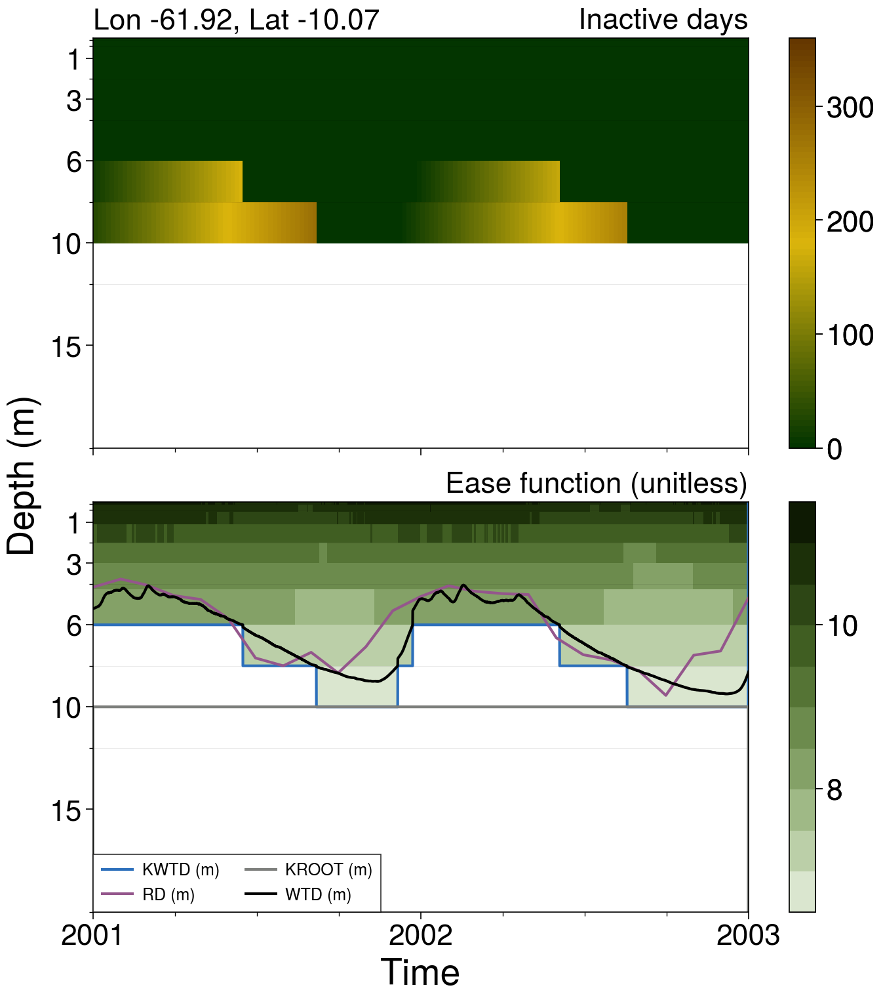

In [343]:
cmap = pplt.Colormap(['dark green','gold','brown'], listmode='continuous')

fig = pplt.figure(refwidth='40em', refheight='25em', sharey=False, spany=True)
axs = fig.subplots(nrows=2, ncols=1, wspace='7em')

pc = axs[0].pcolormesh(data['roots']['time'], depths_roots-(thick/2.), 
                       days[:,jbrx,:,jbry].values.T/86400., cmap=cmap, levels=80, shading='auto', vmax=364)
axs[0].colorbar(pc, ticks=100)
axs[0].format(rtitle='Inactive days', titlesize=16, ltitle='Lon ' + str(np.round(lons[jbrx,jbry].values,2)) + \
              ', Lat ' + str(np.round(lats[jbrx,jbry].values,2)))

cmap = pplt.Colormap('Greens6', listmode='continuous')

pc = axs[1].pcolormesh(data['roots']['time'], depths_roots-(thick/2.), 
                       data['roots']['EASY'][:,jbrx,:,jbry].values.T, cmap=cmap, shading='auto', )
axs[1].plot(data['roots']['time'], masked['KWTD'][:,jbrx,jbry], label='KWTD (m)', color='medium blue')
axs[1].plot(data['roots']['time'], masked['KROOT'][:,jbrx,jbry], label='KROOT (m)', color='medium grey')
axs[1].plot(masked['GWRD'][:,jbrx,jbry].resample(time='MS').mean(dim='time'), label='RD (m)', color='purple')
axs[1].plot(data['roots']['time'], -1*data['roots']['ZWT'][:,jbrx,jbry], color='black', label='WTD (m)')
axs[1].colorbar(pc, ticks=2.0)
axs[1].legend(loc='ll', ncols=2)
axs[1].format(rtitle='Ease function (unitless)',titlesize=16)

axs.format(yreverse=True, xlim=(pd.to_datetime('2001-01-01'), pd.to_datetime('2003-01-01')), ylim=(0,20), ylabel='Depth (m)', 
           ylabelsize=20, xlabel='Time', xlabelsize=20, xlocator='year', xformatter='%Y', ylocator=depths_roots[::2][1:],
           yminorlocator=depths_roots, ygridminor=True, xrotation=False)

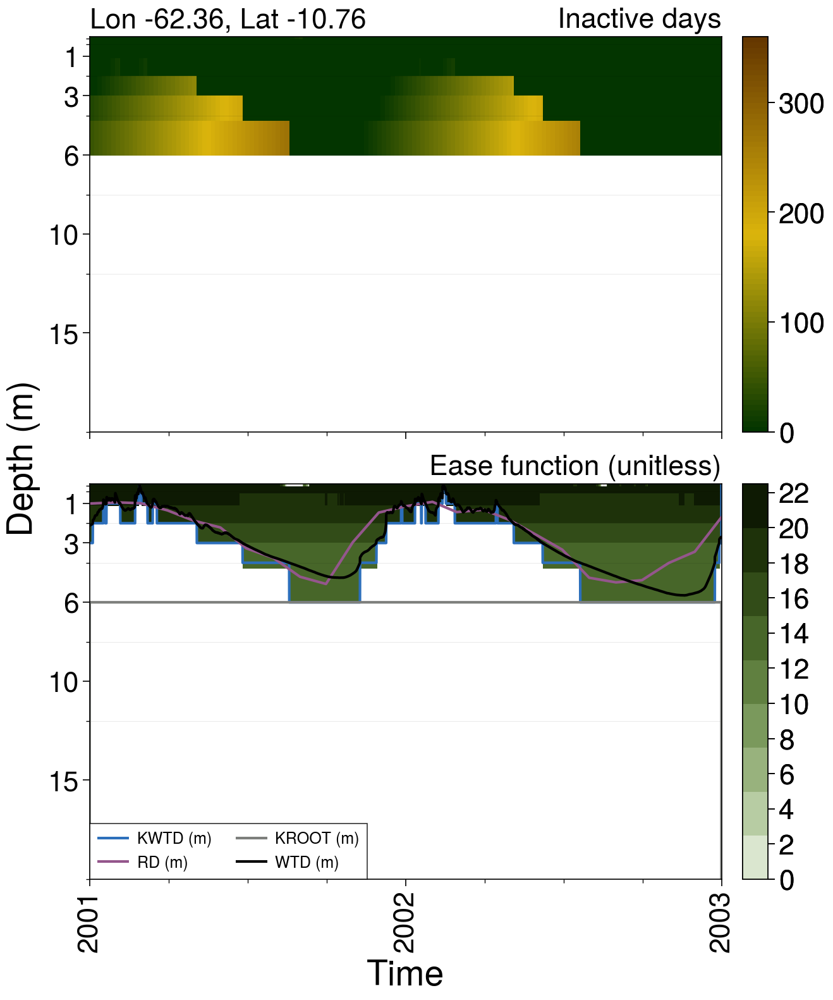

In [328]:
cmap = pplt.Colormap(['dark green','gold','brown'], listmode='continuous')

fig = pplt.figure(refwidth='40em', refheight='25em', sharey=False, spany=True)
axs = fig.subplots(nrows=2, ncols=1, wspace='7em')

pc = axs[0].pcolormesh(data['roots']['time'], depths_roots-(thick/2.), 
                       days[:,fnsx,:,fnsy].values.T/86400., cmap=cmap, levels=80, shading='auto', vmax=364)
axs[0].colorbar(pc, ticks=100)
axs[0].format(rtitle='Inactive days', titlesize=16, ltitle='Lon ' + str(np.round(lons[fnsx,fnsy].values,2)) + \
              ', Lat ' + str(np.round(lats[fnsx,fnsy].values,2)))

cmap = pplt.Colormap('Greens6', listmode='continuous')

pc = axs[1].pcolormesh(data['roots']['time'], depths_roots-(thick/2.), 
                       data['roots']['EASY'][:,fnsx,:,fnsy].values.T, cmap=cmap, shading='auto', )
axs[1].plot(data['roots']['time'], masked['KWTD'][:,fnsx,fnsy], label='KWTD (m)', color='medium blue')
axs[1].plot(data['roots']['time'], masked['KROOT'][:,fnsx,fnsy], label='KROOT (m)', color='medium grey')
axs[1].plot(masked['GWRD'][:,fnsx,fnsy].resample(time='MS').mean(dim='time'), label='RD (m)', color='purple')
axs[1].plot(data['roots']['time'], -1*data['roots']['ZWT'][:,fnsx,fnsy], color='black', label='WTD (m)')
axs[1].colorbar(pc, ticks=2.0)
axs[1].legend(loc='ll', ncols=2)
axs[1].format(rtitle='Ease function (unitless)',titlesize=16)

axs.format(yreverse=True, xlim=(pd.to_datetime('2001-01-01'), pd.to_datetime('2003-01-01')), ylim=(0,20), ylabel='Depth (m)', 
           ylabelsize=20, xlabel='Time', xlabelsize=20, xlocator='year', xformatter='%Y', ylocator=depths_roots[::2][1:],
           yminorlocator=depths_roots, ygridminor=True, xrotation=False)

## Plot means of rooting depth

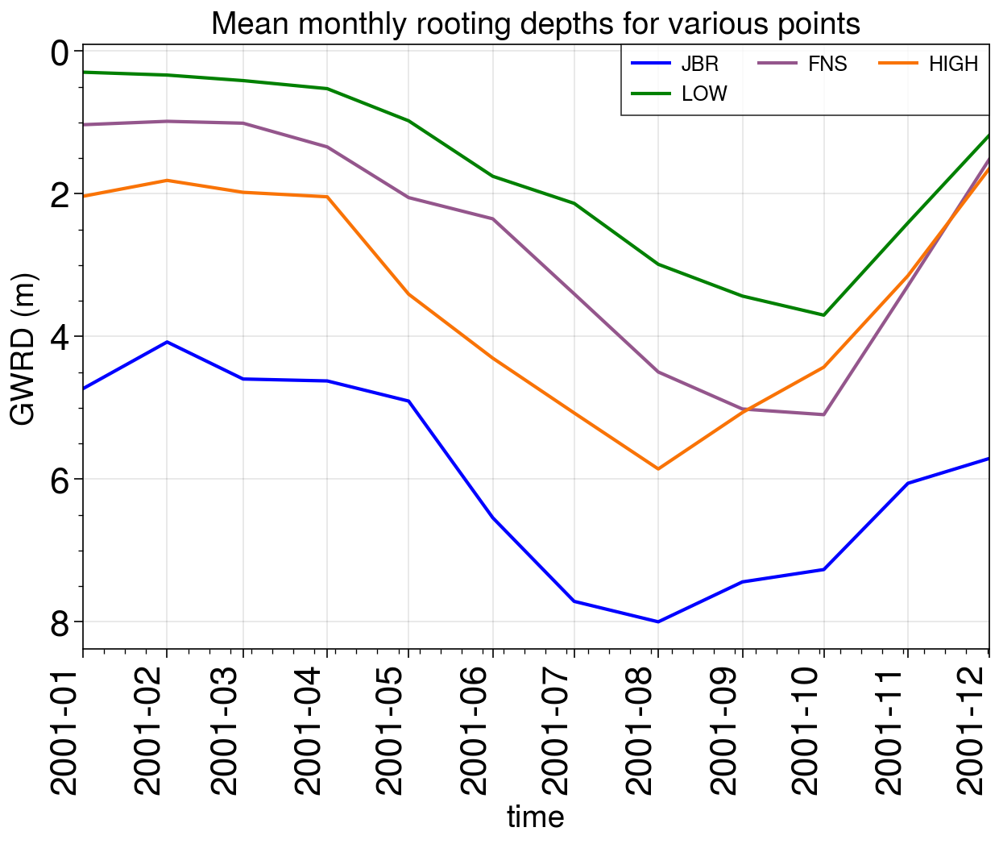

In [66]:
fig = pplt.figure(refwidth='45em', refheight='30em', sharey=False, spanx=True)
axs = fig.subplots(nrows=1, ncols=1, wspace='7em')

masked['GWRD'][:,jbrx,jbry].resample(time='MS').mean(dim='time').plot(color='blue', label='JBR')
masked['GWRD'][:,fnsx,fnsy].resample(time='MS').mean(dim='time').plot(color='purple', label='FNS')
masked['GWRD'][:,hx,hy].resample(time='MS').mean(dim='time').plot(color='orange', label='HIGH')
masked['GWRD'][:,lx,ly].resample(time='MS').mean(dim='time').plot(color='green', label='LOW')
plt.legend()
axs.format(yreverse=True, title='Mean monthly rooting depths for various points', titlesize=14,
           ylabel='GWRD (m)')

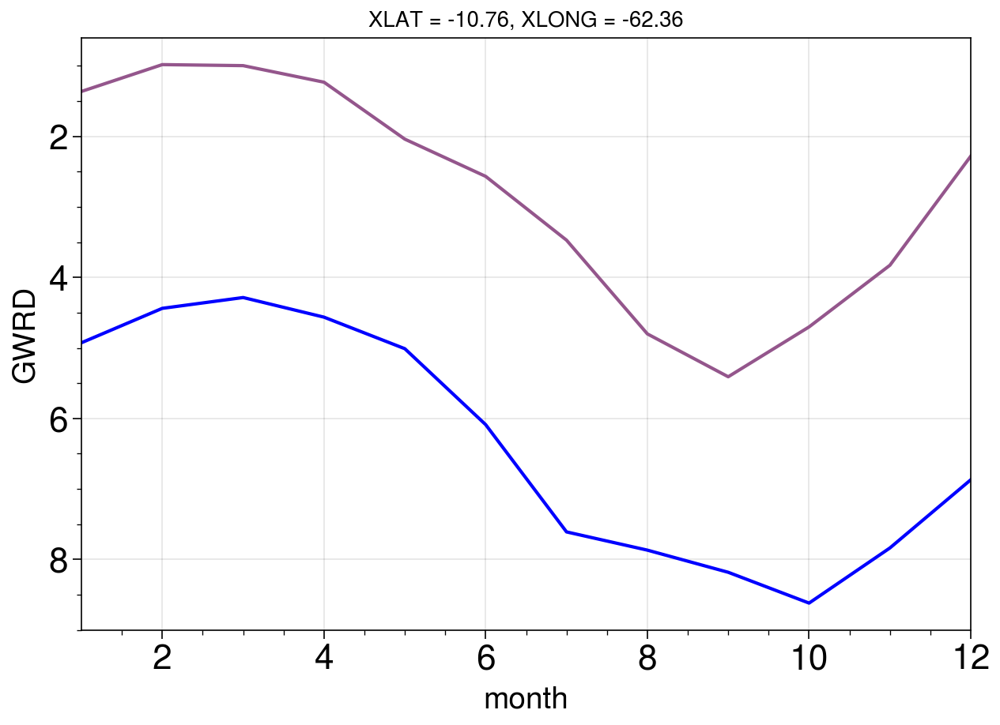

In [324]:
fig = pplt.figure(refwidth='45em', refheight='30em', sharey=False, spanx=True)
axs = fig.subplots(nrows=1, ncols=1, wspace='7em')

masked['GWRD'][:,jbrx,jbry].groupby('time.month').mean(dim='time').plot(color='blue')
masked['GWRD'][:,fnsx,fnsy].groupby('time.month').mean(dim='time').plot(color='purple')
#masked['GWRD'][:,hx,hy].resample(time='MS').mean(dim='time').plot(color='orange')
#masked['GWRD'][:,lx,ly].resample(time='MS').mean(dim='time').plot(color='green')

axs.format(yreverse=True)

## Comparing runs with and without additional soil layers at highland

In [68]:
dayr = data['roots'][['ETRAN','QRAIN','SOIL_W','ZWT']].groupby('time.date').mean('time')
days = data['soil'][['ETRAN','QRAIN','SOIL_W','ZWT', 'LH']].groupby('time.date').mean('time')
dayo = data['fd'][['ETRAN','QRAIN','SOIL_W','ZWT', 'LH']].groupby('time.date').mean('time')

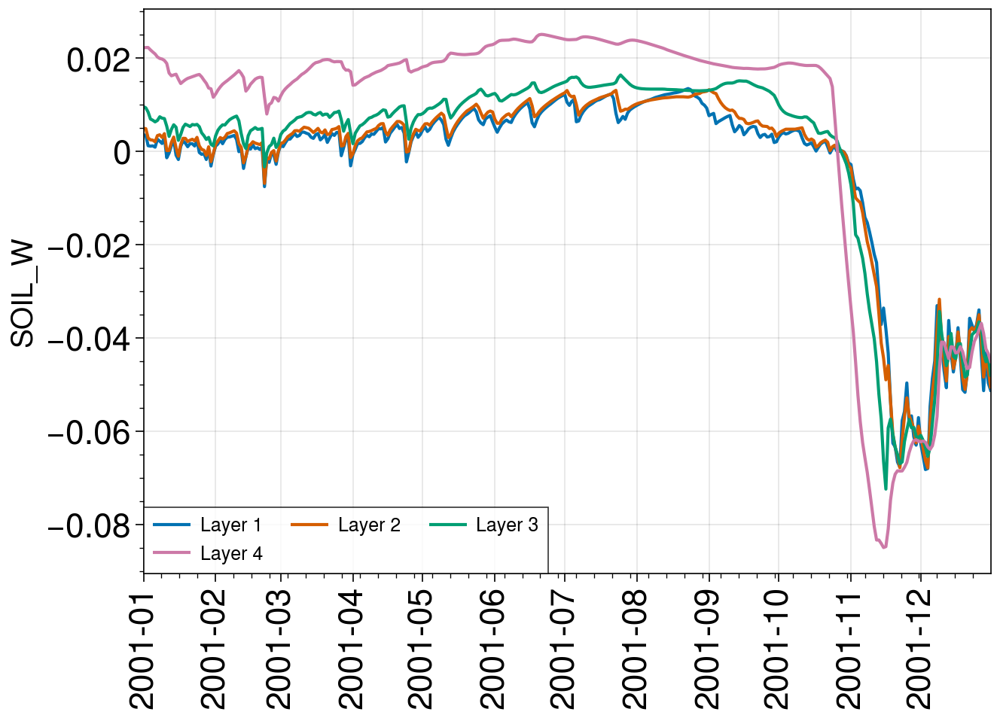

In [69]:
fig = pplt.figure(refwidth='45em', refheight='30em', sharey=False, spanx=True)

time = pd.to_datetime(days['date'].values)
plt.plot(time, dayo['SOIL_W'][:,hx,:4,hy] - days['SOIL_W'][:,hx,:4,hy], labels=['Layer 1','Layer 2','Layer 3','Layer 4'])
plt.legend()

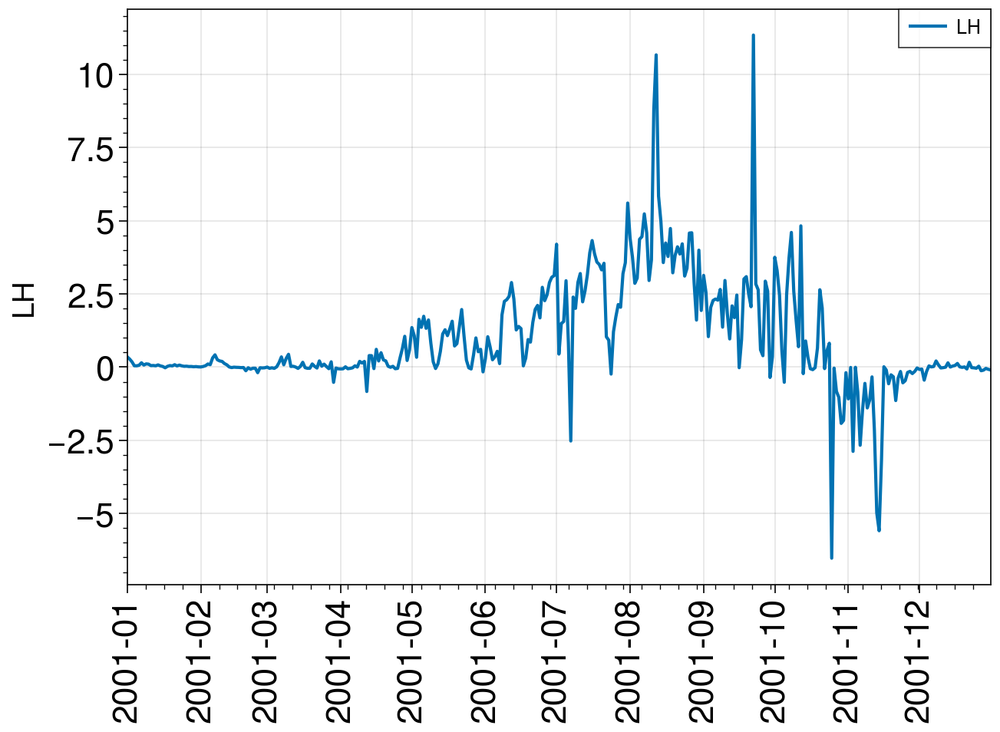

In [70]:
fig = pplt.figure(refwidth='45em', refheight='30em', sharey=False, spanx=True)

time = pd.to_datetime(days['date'].values)
plt.plot(time, dayo['LH'][:,hx,hy] - days['LH'][:,hx,hy])
plt.legend()

## Daily time series

In [95]:
def etpcpsm():
    
    
    for x, y in [(jbrx, jbry), (fnsx, fnsy), (hx, hy), (lx, ly), (mx, my)]:
        
            pplt.rc['legend.fontsize']=16
        
            fig = pplt.figure(refwidth='45em', refheight='30em', sharey=False, spanx=True)
            axs = fig.subplots(nrows=2, ncols=2, wspace='7em')

            depths = depths_roots
            yticks = depths
            thick  = np.asarray([0.1]+[depths[x+1]-depths[x] for x in range(len(depths)-1)])

            time = pd.to_datetime(dayr['date'].values)

            axs[0].plot(time, dayr['ETRAN'][:,x,y].values, color='black', zorder=1)
            axs[0].format(ylim=(-1e-6, 1e-4), xgrid=False, lltitle='Transpiration (mm/s)',
                          ylocator=[2e-5,4e-5], ygrid=False, titlesize=16, titlebbox=True, 
                          titlebboxalpha=0.7, titlebboxpad=0.25, yformatter='sci', 
                          ltitle='Lon ' + str(np.round(lons[x,y].values,2)) + ', Lat ' + str(np.round(lats[x,y].values,2)))

            ty = axs[0].alty()
            ty.bar(time, dayr['RAINRATE'][:,x,y].values, color='cornflowerblue')
            ty.format(yreverse=True, ylim=(0,80), ylocator=[])

            cmap = pplt.Colormap('Speed')
            pc   = axs[2].pcolormesh(time, depths-(thick/2.), dayr['SOIL_W'][:,x,:,y].values.T, cmap=cmap, 
                                     shading='auto', vmin=0.2, vmax=0.5)
            axs[2].area(time, -1*dayr['ZWT'][:,x,y].values, 100, stacked=True, color='grey') 
            axs[2].set_ylabel('Depth (m)', fontsize=20)
            axs[2].plot(time, -1*dayr['ZWT'][:,x,y].values, color='black', linewidth=2, 
                        label='Water table depth (m)')
            axs[2].legend(loc='ll')
            axs[2].format(ticklabelsize=12, titlesize=16, ltitle='Soil moisture ($m^3/m^3$)', 
                          titlecolor='Dark green', ylocator=depths[::2][1:], yminorlocator=depths, 
                          ygridminor=True, ygrid=True, xgrid=False, ylim=(0, 20), yreverse=True,
                          legendfontsize='50em', legendborderaxespad=1)
            
            depths = depths_orig
            yticks = depths
            thick  = np.asarray([0.1]+[depths[x+1]-depths[x] for x in range(len(depths)-1)])

            axs[1].plot(time, dayo['ETRAN'][:,x,y].values, color='black')
            axs[1].format(ylim=(-1e-6, 1e-4), xgrid=False, 
                          ylocator=[], ygrid=False)

            ty = axs[1].alty(color='cornflowerblue', linewidth=1)
            ty.bar(time, dayo['RAINRATE'][:,x,y].values, color='cornflowerblue')
            ty.format(yreverse=True, ylim=(0,80), ylocator=[10,30], rtitle='Precipitation (mm/day)',
                      titlecolor='cornflowerblue', titlesize=16, yticklabelsize=20)
            
            pc   = axs[3].pcolormesh(time, depths-(thick/2.), dayo['SOIL_W'][:,x,:,y].values.T, cmap=cmap, 
                                     shading='auto', vmin=0.2, vmax=0.5, extend='both')
            axs[3].area(time, -1*dayo['ZWT'][:,x,y].values, 100, stacked=True, color='grey') 
            axs[3].colorbar(pc, shrink=0.8, ticks=0.06, ticklabelsize=20)
            axs[3].format(ticklabelsize=12, titlesize=14, yreverse=True, 
                          ylocator=depths[1::2], yminorlocator=depths, ygridminor=True, 
                          ygrid=True, xgrid=False, ylim=(0, 20)
                          )
            axs[3].plot(time, -1*dayo['ZWT'][:,x,y].values, color='black', linewidth=2)
            

            axs.format(gridcolor='grey9', 
            xlocator='date', xlabel='Time', xlabelsize=22, yticklabelsize=20, xrotation=False,
            xticklabelsize=16, toplabels=['ROOTS','CONTROL'], toplabels_kw={'fontsize':20, 'color':'gray7'}
            )
            
            pplt.rc['legend.fontsize']='medium'
            
   

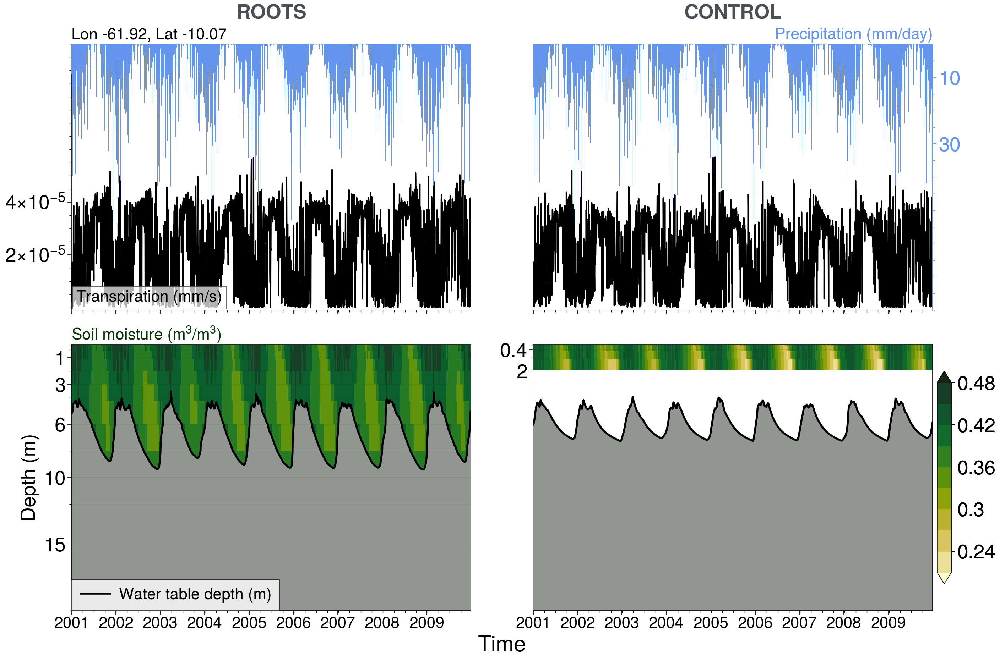

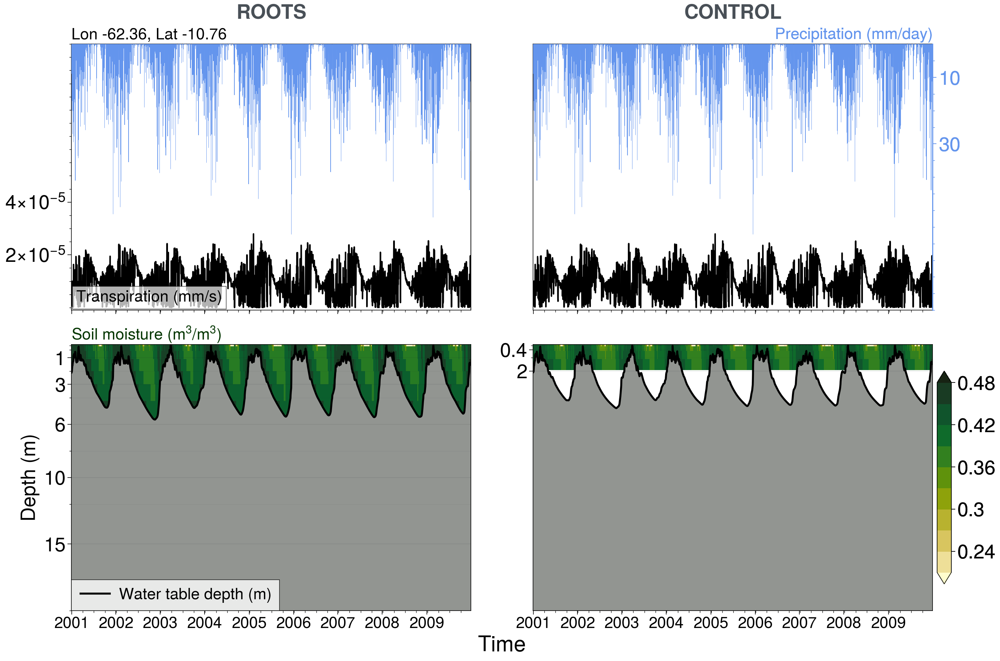

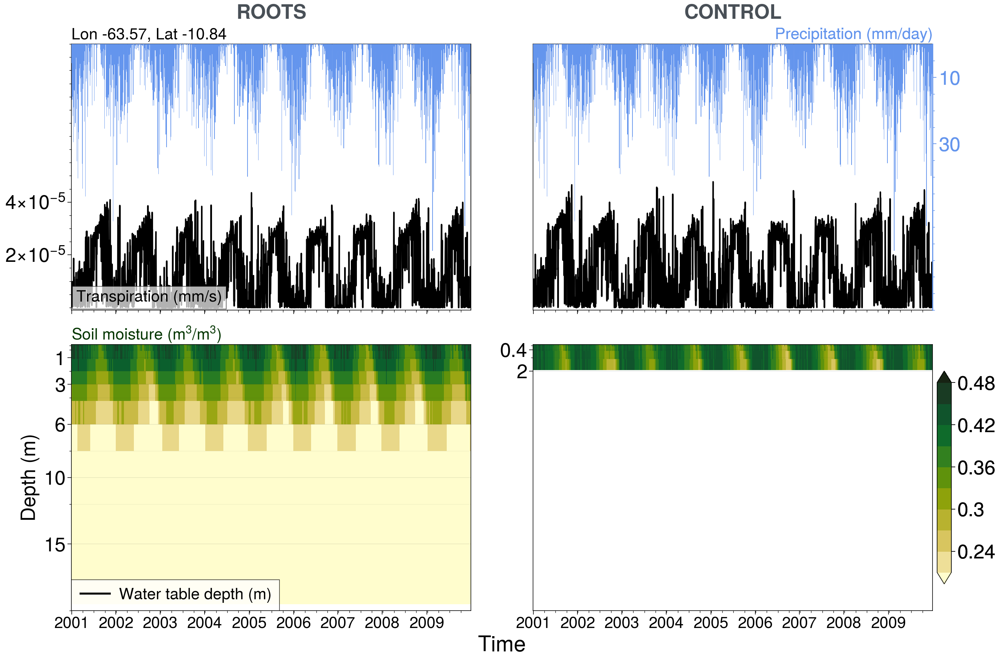

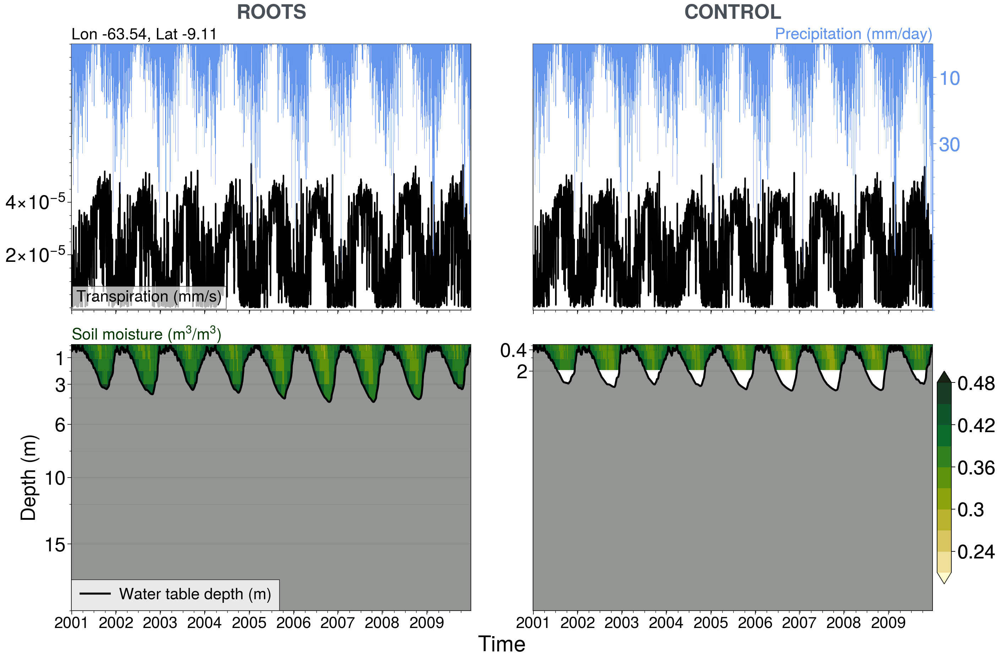

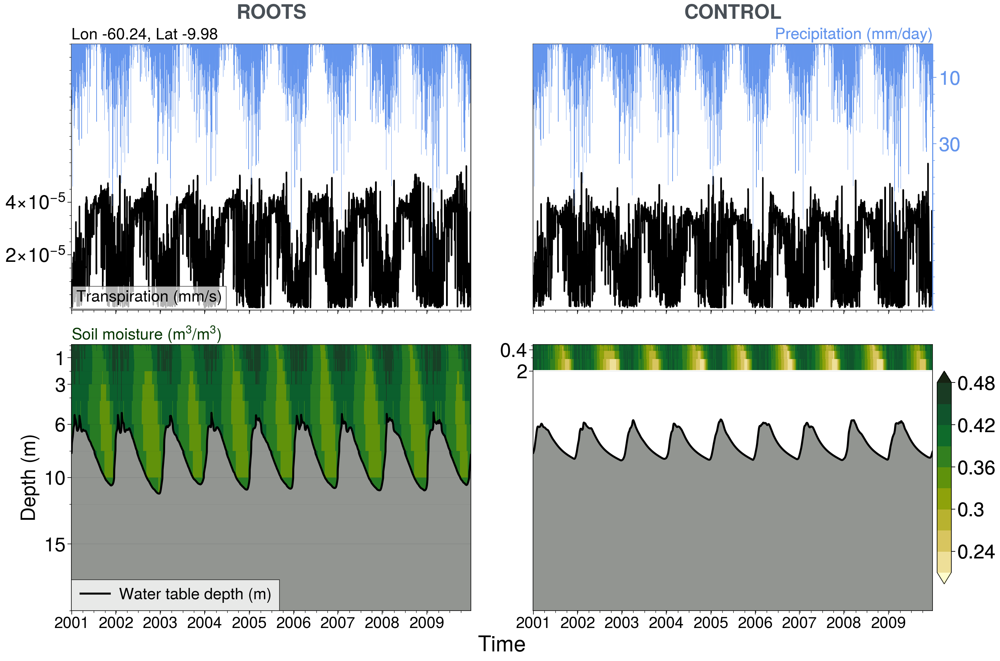

In [96]:
etpcpsm()

In [335]:
uptake = data['roots']['UPTAKE']*86400

In [342]:
uptake = uptake.groupby('time.date').mean(dim='time')

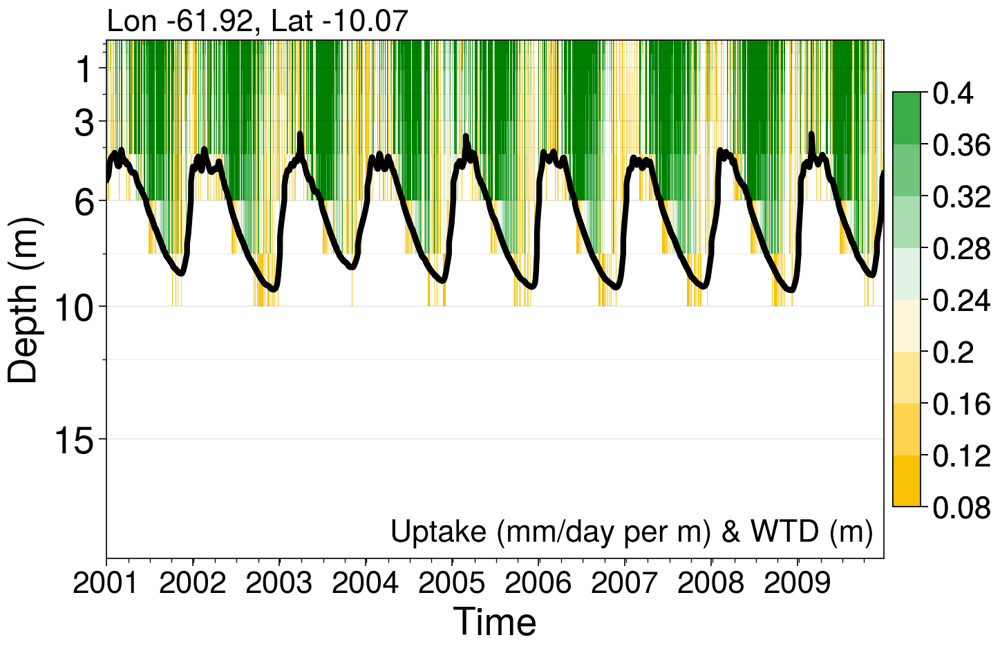

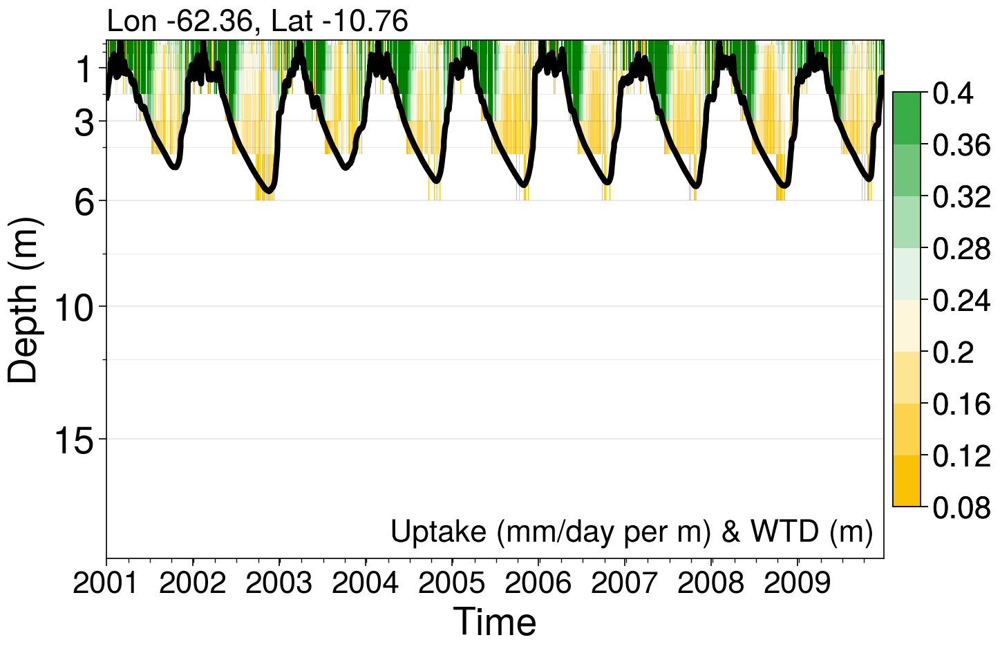

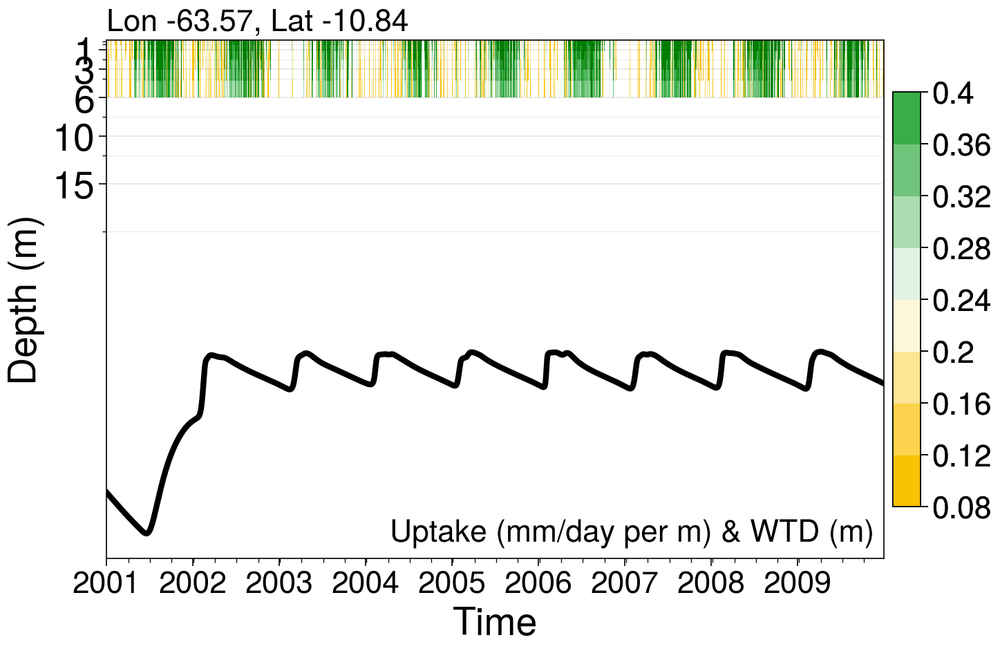

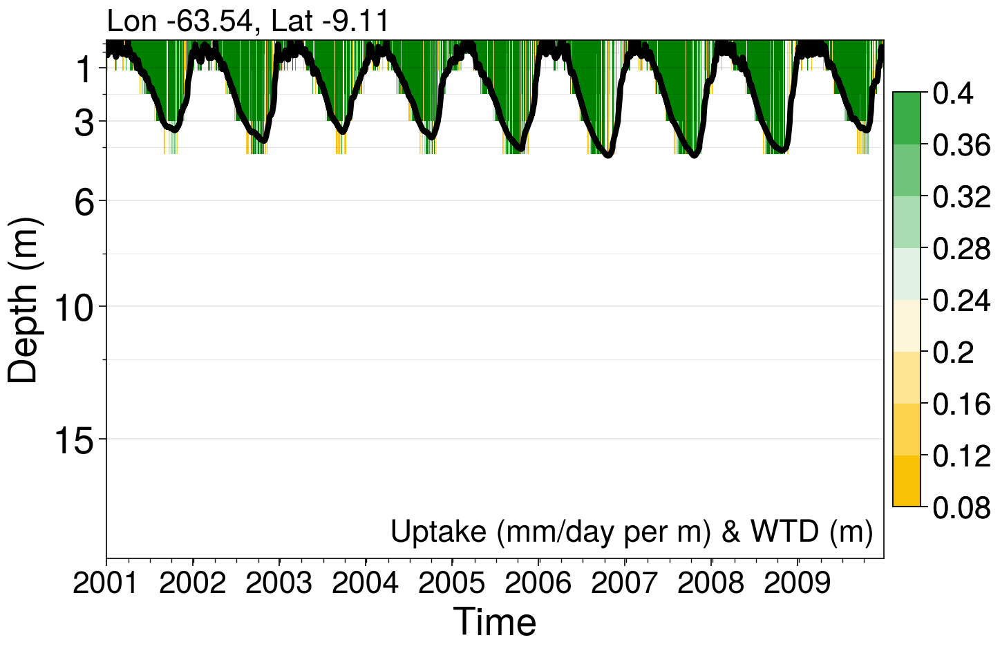

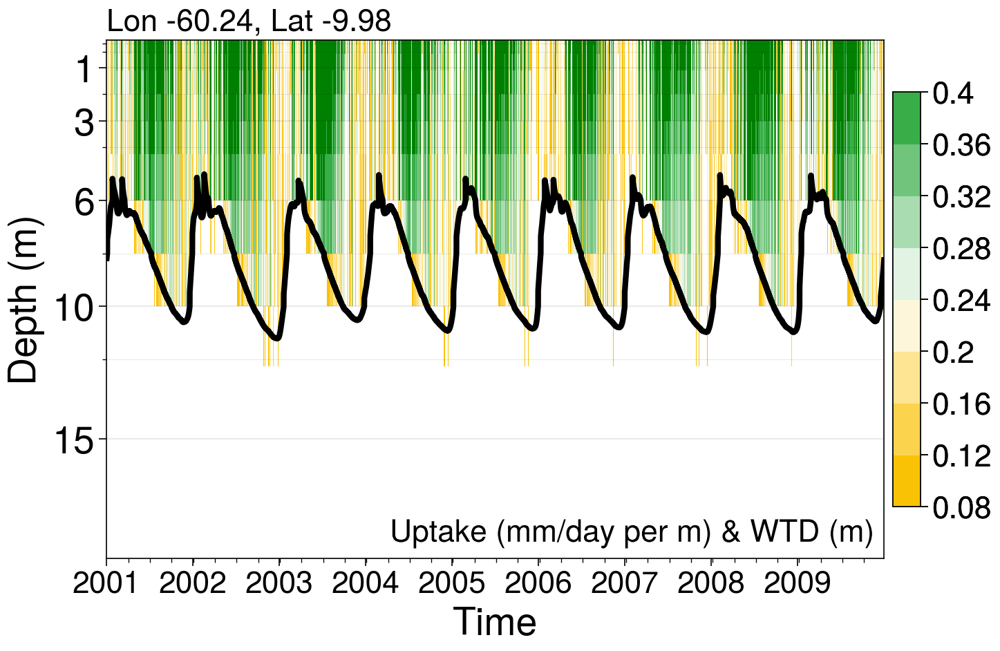

In [358]:
for x, y in [(jbrx, jbry), (fnsx, fnsy), (hx, hy), (lx, ly), (mx, my)]:

    depths = depths_roots
    yticks = depths
    thick  = np.asarray([0.1]+[depths[x+1]-depths[x] for x in range(len(depths)-1)])
    
    fig  = pplt.figure(space=0, refwidth='45em', refheight='30em', sharey=False)
    axs = fig.subplots(nrows=1, ncols=1)

    time = pd.to_datetime(uptake['date'].values)
    
    cmap = pplt.Colormap(['goldenrod','white','medium green'], listmode='continuous')
    cmap.set_under('white')
    cmap.set_over('green')

    cf = axs[0].pcolormesh(time, depths-(thick/2.), (uptake[:,x,y,:]/thick).T,
                           cmap=cmap, shading='auto', vmin=0.05, vmax=0.4)

    axs[0].plot(data['roots']['time'], -1*data['roots']['ZWT'][:,x,y], color='black', linewidth=3, label='ZWT')
    axs[0].colorbar(cf, label='', shrink=0.8)
    axs[0].set_xlabel('Time', fontsize=20)
    axs[0].set_ylabel('Depth (m)', fontsize=20)
    axs[0].format(lrtitle='Uptake (mm/day per m) & WTD (m)', titlesize=16, 
                  yreverse=True, ylocator=depths[::2][1:], yminorlocator=depths, ygridminor=True, 
                  ygrid=True, xgrid=False)
    
    axs.format(ltitle = 'Lon ' + str(np.round(lons[x,y].values,2)) + ', Lat ' + str(np.round(lats[x,y].values,2)), 
    xrotation=0, yticklabelsize=20, xticklabelsize=16, titlesize=16
    )

## LAI plot

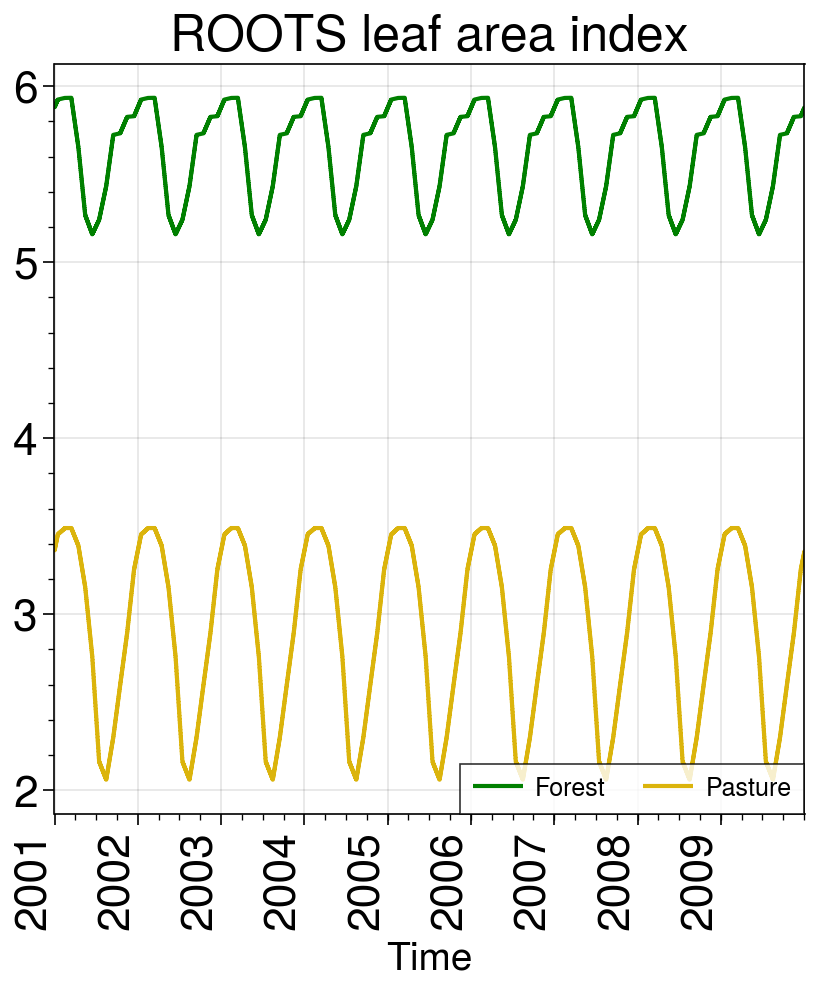

In [390]:
fig = pplt.figure(refwidth='30em')
axs = fig.subplots(nrows=1, ncols=1)

data['roots']['LAI'][:,jbrx,jbry].plot(label='Forest', color='Green')
data['roots']['LAI'][:,fnsx,fnsy].plot(label='Pasture', color='Gold')
axs.legend(loc='lr')

axs.format(title='ROOTS leaf area index', titlesize=18, xlabel='Time', ylabel='')

## Annual plots

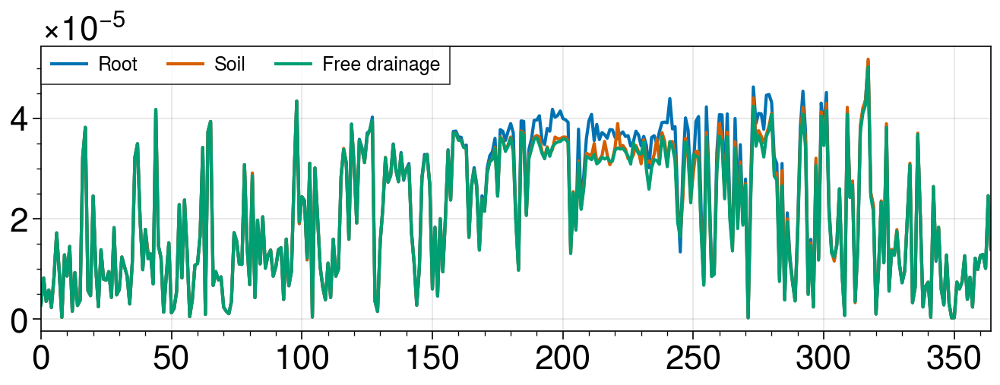

In [52]:
fig = pplt.figure(space=0, refwidth='50em', refheight='15em')
plt.plot(data['roots']['ETRAN'][:,jbrx,jbry].groupby('time.date').mean('time').values, label='Root')
plt.plot(data['soil']['ETRAN'][:,jbrx,jbry].groupby('time.date').mean('time').values, label='Soil')
plt.plot(data['fd']['ETRAN'][:,jbrx,jbry].groupby('time.date').mean('time').values, label='Free drainage')
#plt.xlim(150,300)
plt.legend()

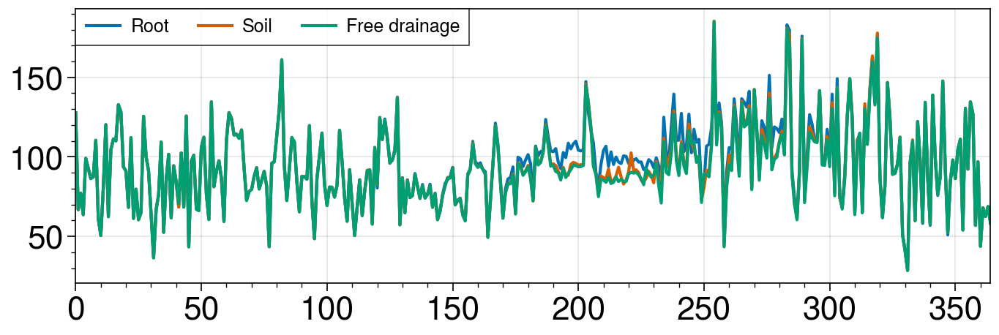

In [53]:
fig = pplt.figure(space=0, refwidth='50em', refheight='15em')
plt.plot(data['roots']['LH'][:,jbrx,jbry].groupby('time.date').mean('time').values, label='Root')
plt.plot(data['soil']['LH'][:,jbrx,jbry].groupby('time.date').mean('time').values, label='Soil')
plt.plot(data['fd']['LH'][:,jbrx,jbry].groupby('time.date').mean('time').values, label='Free drainage')
#plt.xlim(150,300)
plt.legend()

In [23]:
doyr = data['roots'][['ETRAN','ECAN','EDIR','LH','HFX','RAINRATE']].groupby('time.dayofyear').mean('time')
doys = data['soil'][['ETRAN','LH','HFX','RAINRATE']].groupby('time.dayofyear').mean('time')
doyo = data['original'][['ETRAN','ECAN','EDIR','LH','HFX','RAINRATE']].groupby('time.dayofyear').mean('time')

/glade/work/cab478/conda-envs/my-npl-ml/lib/python3.7/site-packages/numpy/core/fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)
/glade/work/cab478/conda-envs/my-npl-ml/lib/python3.7/site-packages/numpy/core/fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)
/glade/work/cab478/conda-envs/my-npl-ml/lib/python3.7/site-packages/numpy/core/fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)
/glade/work/cab478/conda-envs/my-npl-ml/lib/python3.7/site-packages/numpy/core/fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)
/glade/work/cab478/conda-envs/my-npl-ml/lib/python3.7/site-packages/numpy/core/fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype,

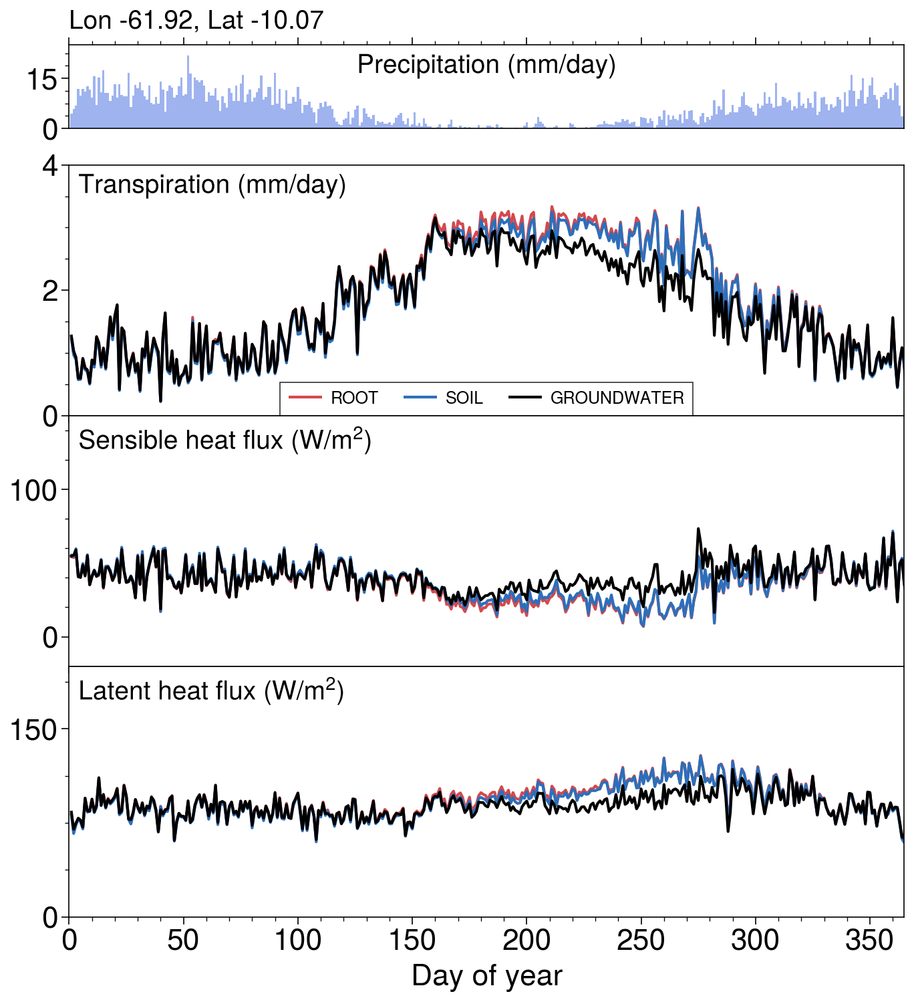

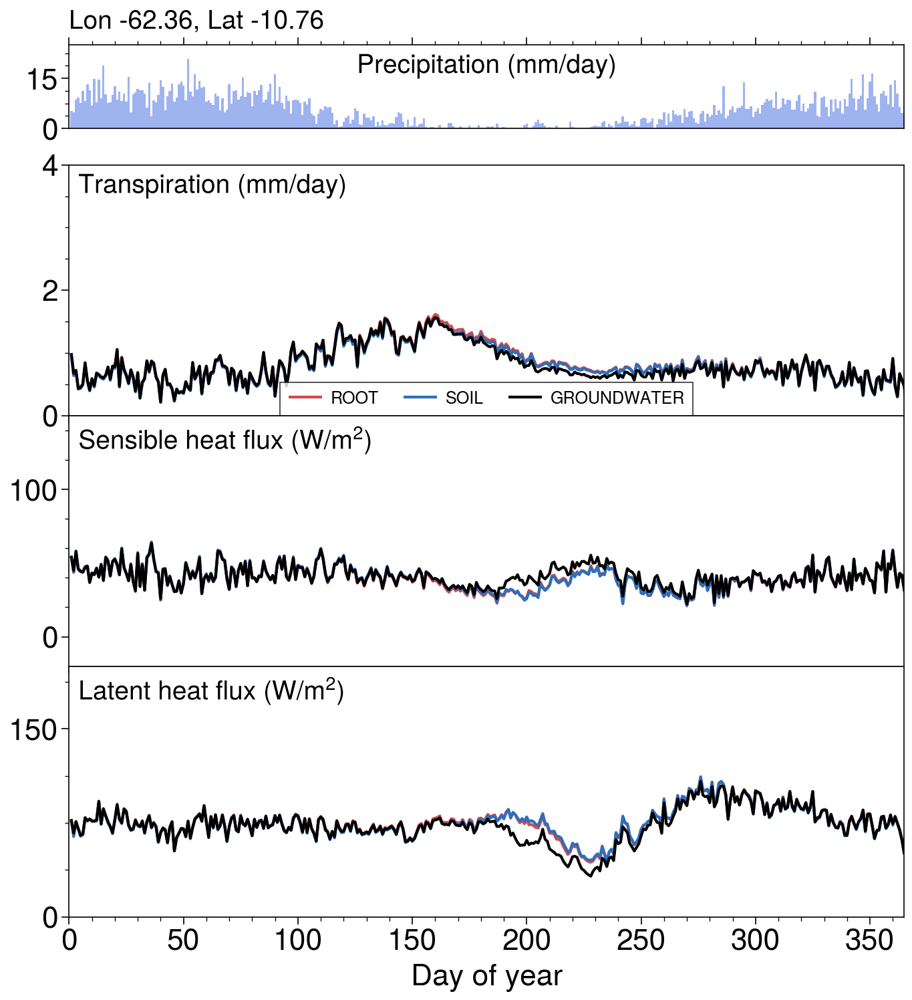

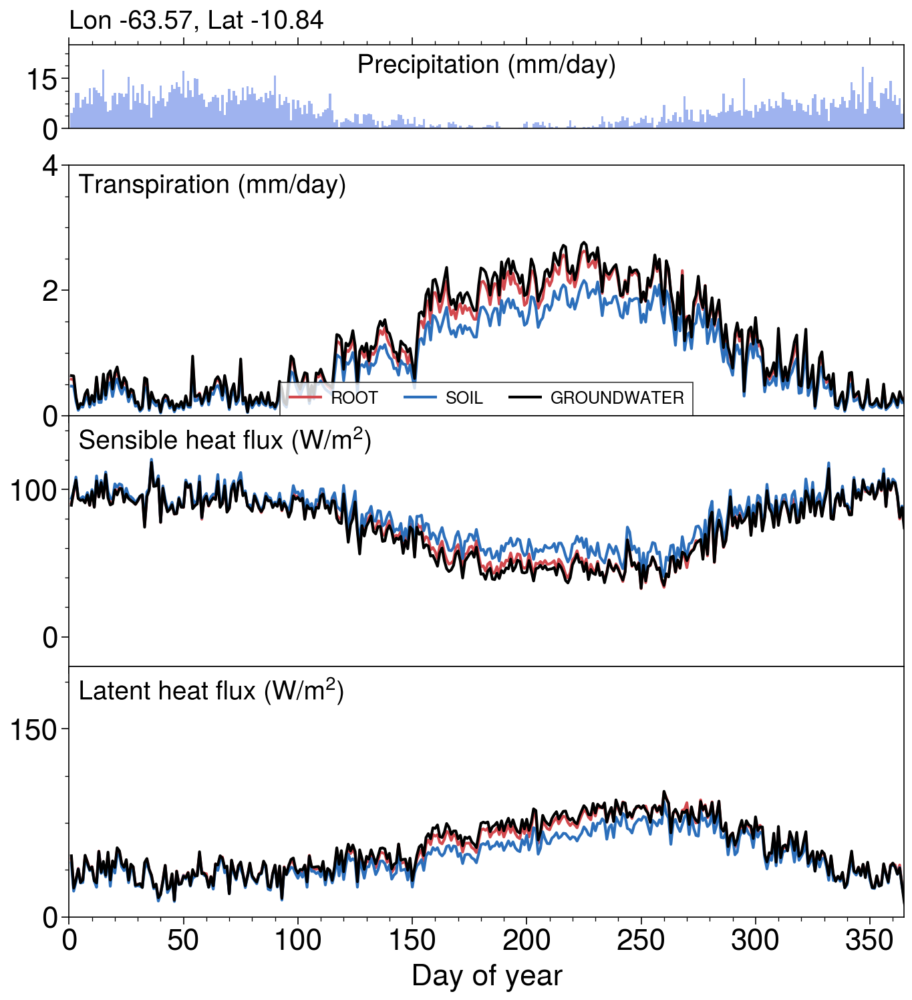

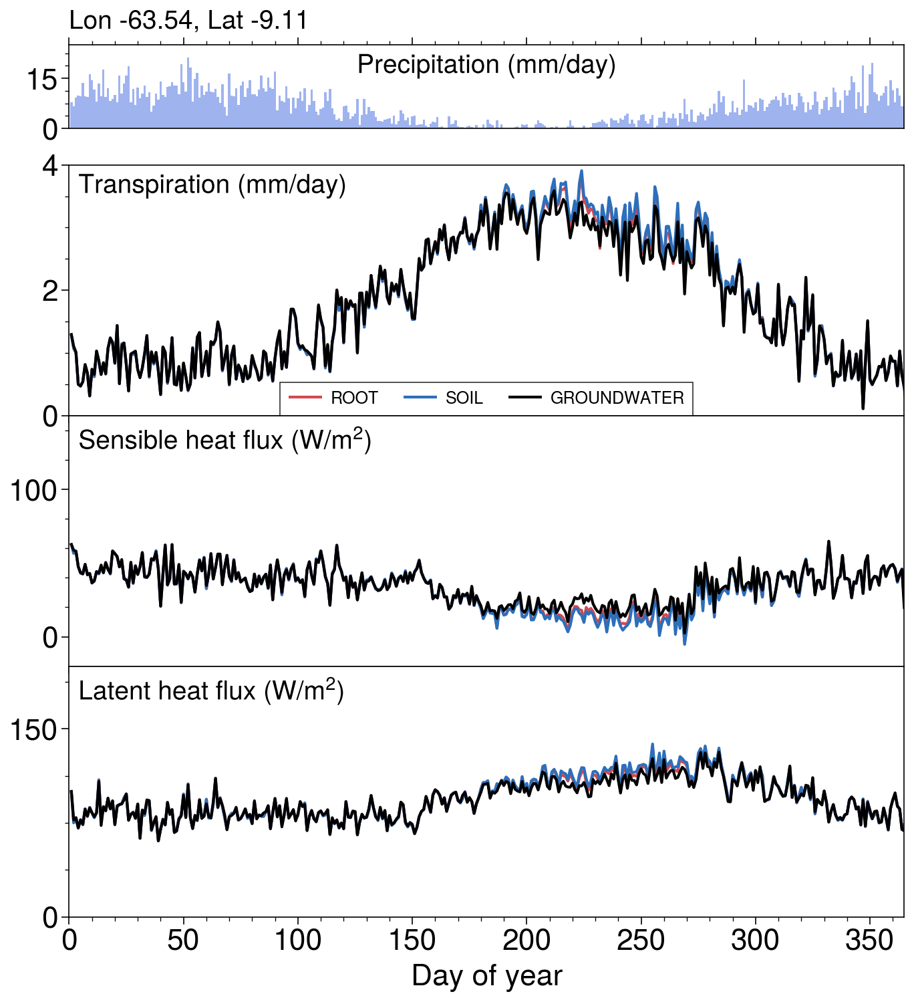

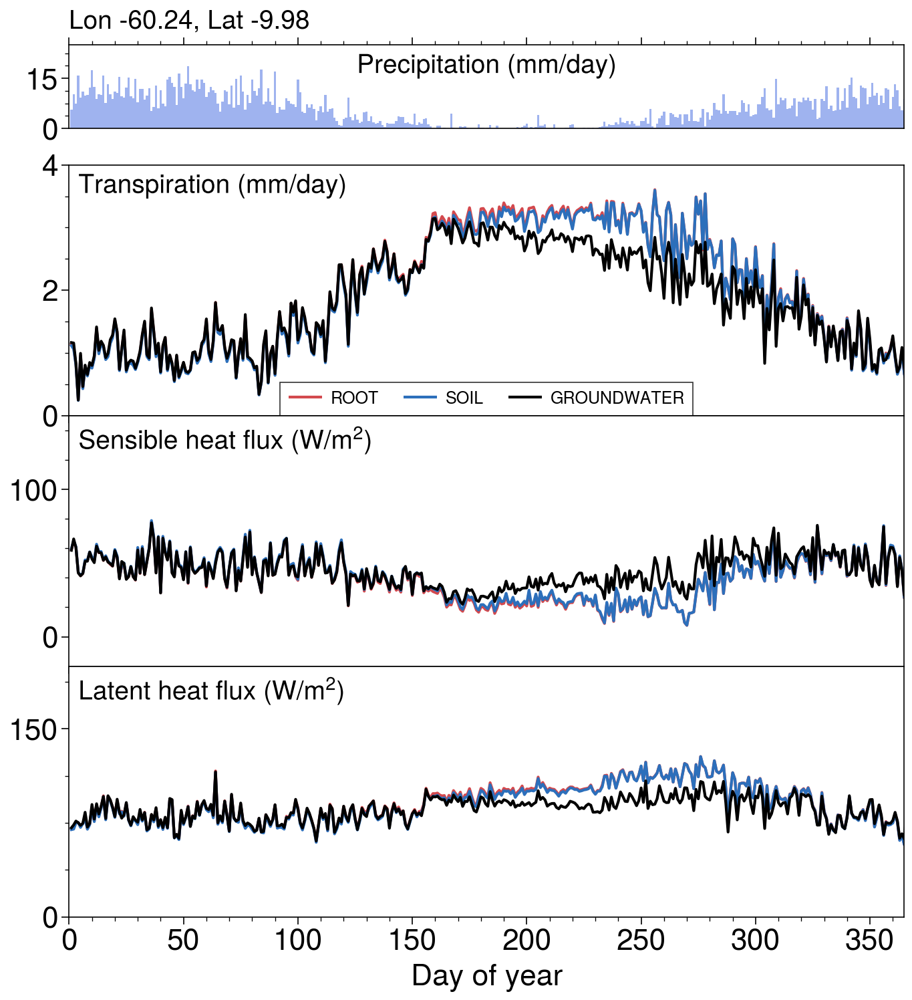

In [24]:
for x, y in [(jbrx, jbry), (fnsx, fnsy), (hx, hy), (lx, ly), (mx, my)]:

    pplt.rc['legend.fontsize']='medium'
    
    fig = pplt.figure(space=0, refwidth='50em', refheight='15em', sharey=False)
    axs = fig.subplots(nrows=3, ncols=1)

    time = doyr['dayofyear'].values
    
    pax = axs[0].panel_axes('t', width='10en')
    #ty  = axs[0].alty(color='royalblue', label='mm/s')
    pax.bar(time, doyr['RAINRATE'][:,x,y].values, color='royalblue', width=1, alpha=0.5)
    pax.format(uctitle='Precipitation (mm/day)', titlesize=14, xgrid=False, ylim=(0,25),
               ylocator=[0,15], ygrid=False)

    axs[0].plot(time, doyr['ETRAN'][:,x,y].values*86400., color='faded red', label='ROOT')
    axs[0].plot(time, doys['ETRAN'][:,x,y].values*86400., color='medium blue', label='SOIL')
    axs[0].plot(time, doyo['ETRAN'][:,x,y].values*86400., color='black', label='GROUNDWATER')
    axs[0].legend(loc='lc')
    axs[0].format(ylocator=[0,2,4], ylim=(0,4),
                  ultitle='Transpiration (mm/day)', yformatter='sci', 
                  titlesize=14,
                  ltitle='Lon ' + str(np.round(lons[x,y].values,2)) + ', Lat ' + str(np.round(lats[x,y].values,2)))
    
    axs[1].plot(time, doyr['HFX'][:,x,y].values, color='faded red')
    axs[1].plot(time, doys['HFX'][:,x,y].values, color='medium blue')
    axs[1].plot(time, doyo['HFX'][:,x,y].values, color='black')
    axs[1].format(ylim=(-20, 150),
                   ylocator=[0,100], ultitle='Sensible heat flux ($W/m^2$)', titlesize=14, ygrid=False)
    
    axs[2].plot(time, doyr['LH'][:,x,y].values, color='faded red')
    axs[2].plot(time, doys['LH'][:,x,y].values, color='medium blue')
    axs[2].plot(time, doyo['LH'][:,x,y].values, color='black')
    axs[2].format(ylim=(0, 200),
                   ylocator=[0,150], ultitle='Latent heat flux ($W/m^2$)', titlesize=14, ygrid=False)
    
    fig.format( 
        suptitlecolor='gray7', suptitlesize=18, xlabel='Day of year', xlabelsize=16, 
        ylabelsize=16, xlim=(0,365), xgrid=False, ygrid=False)

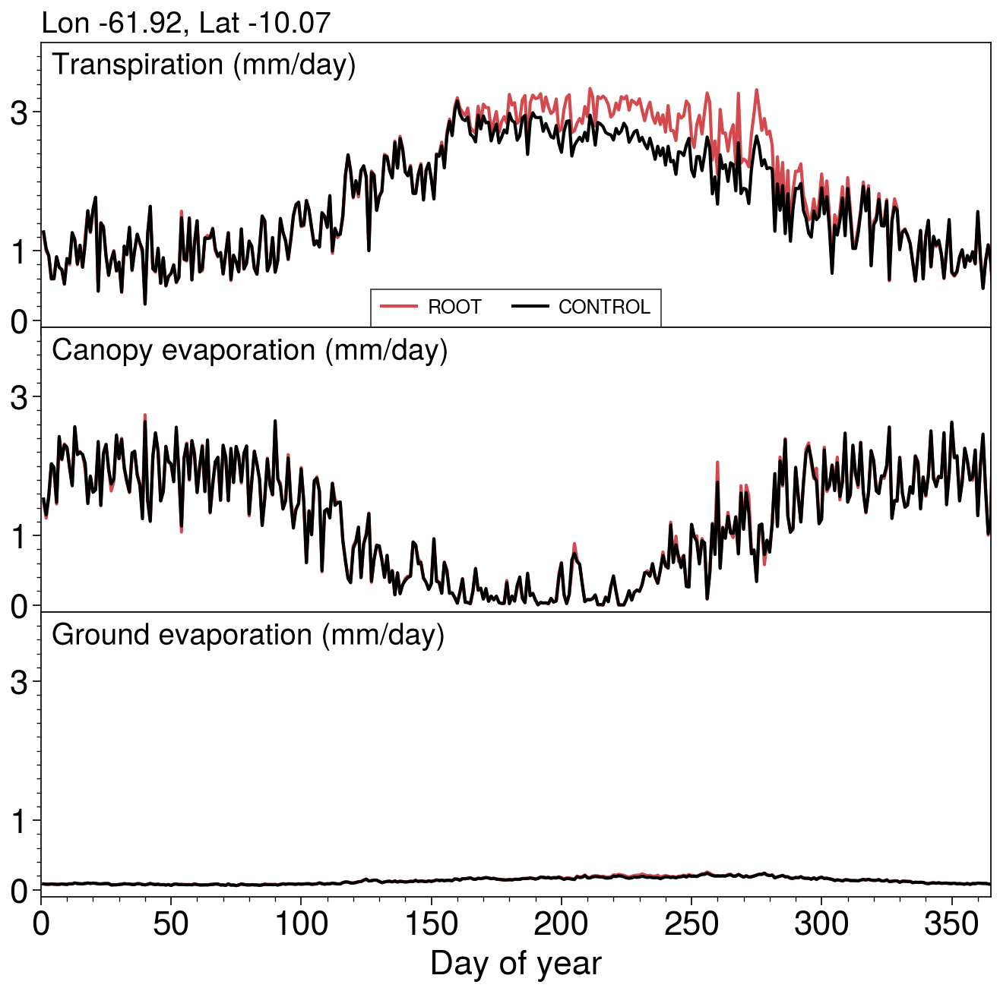

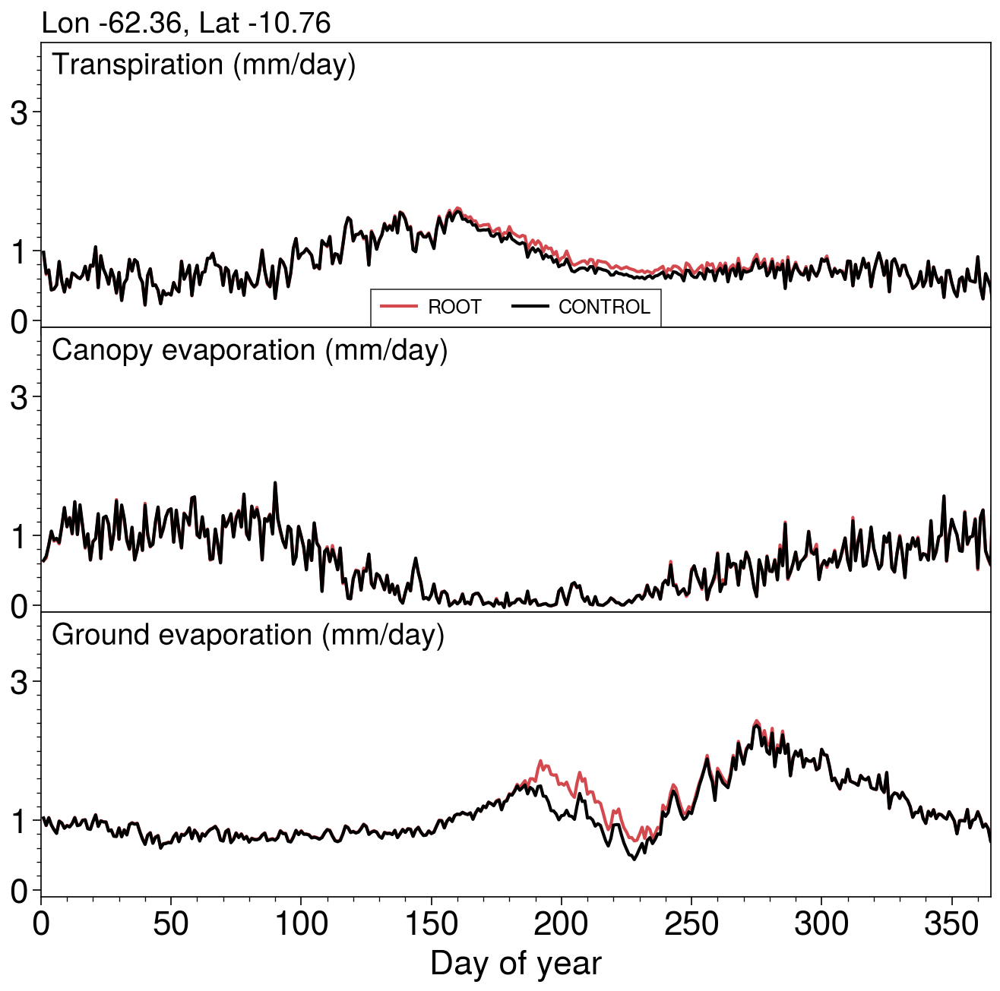

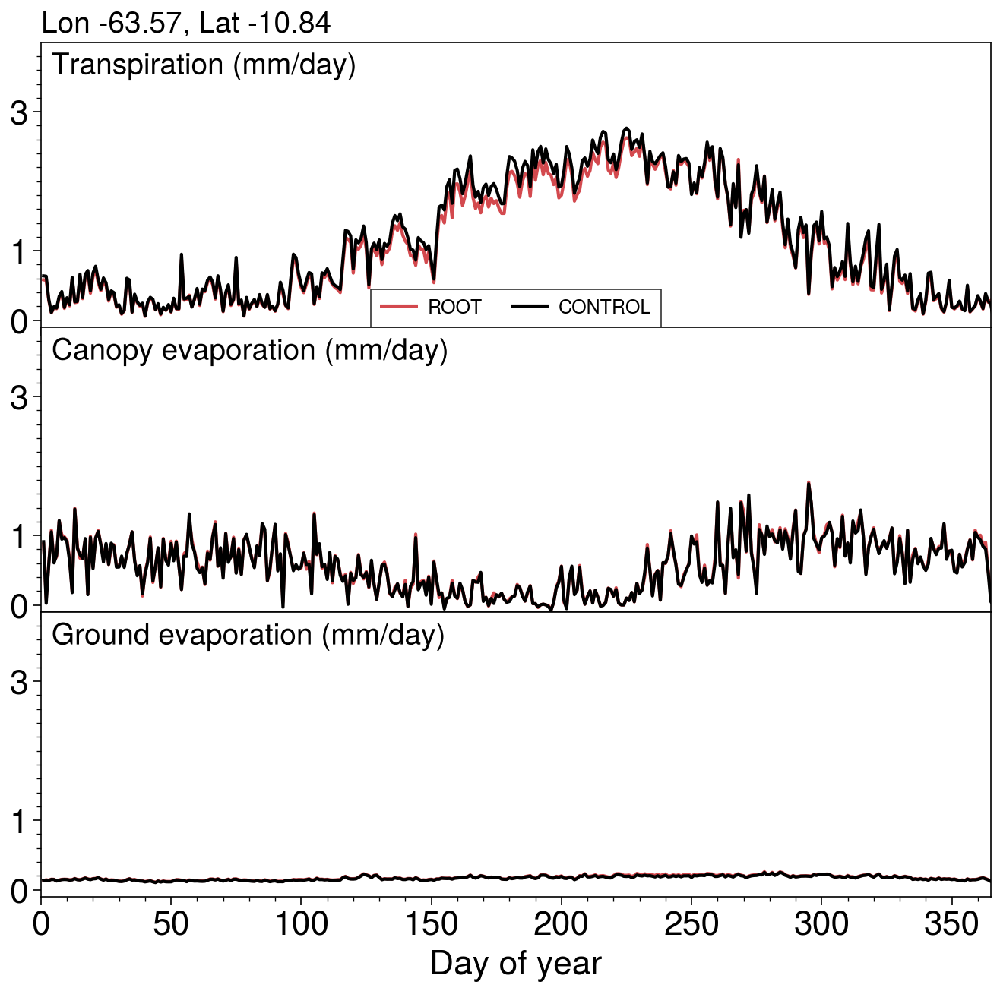

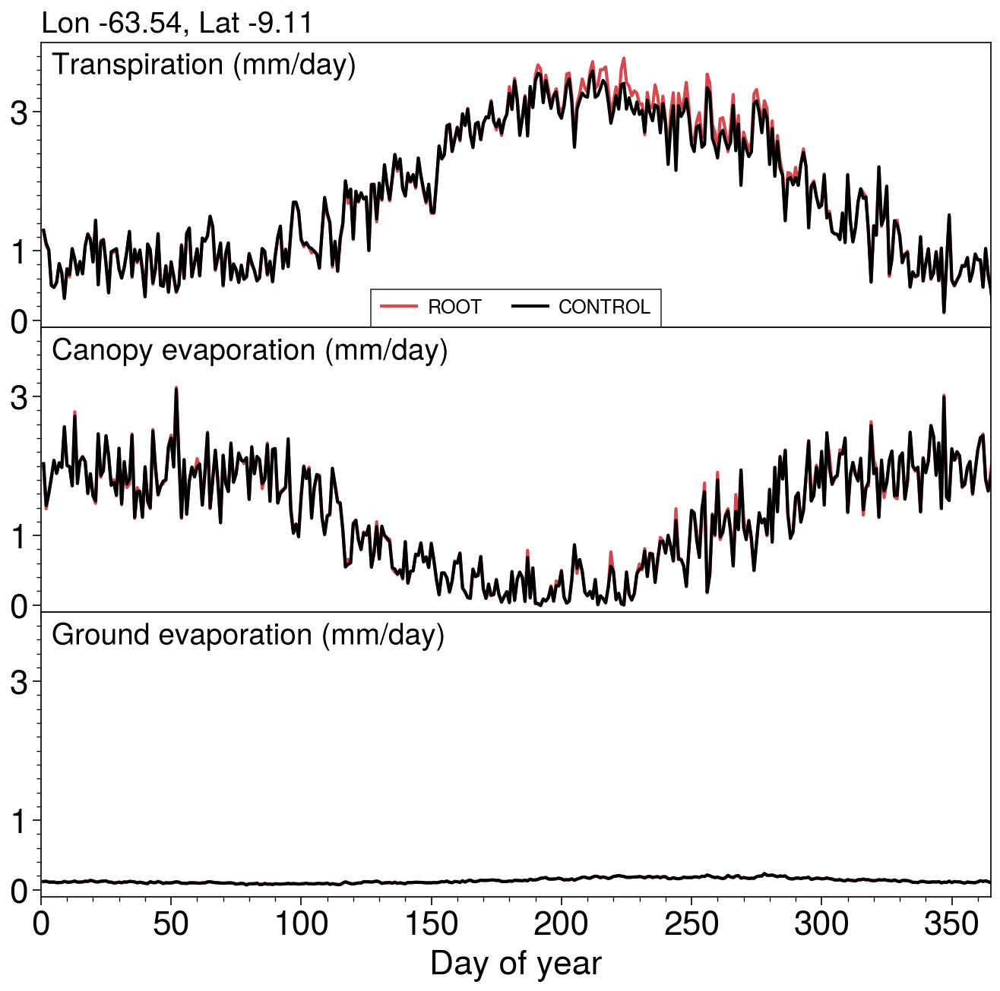

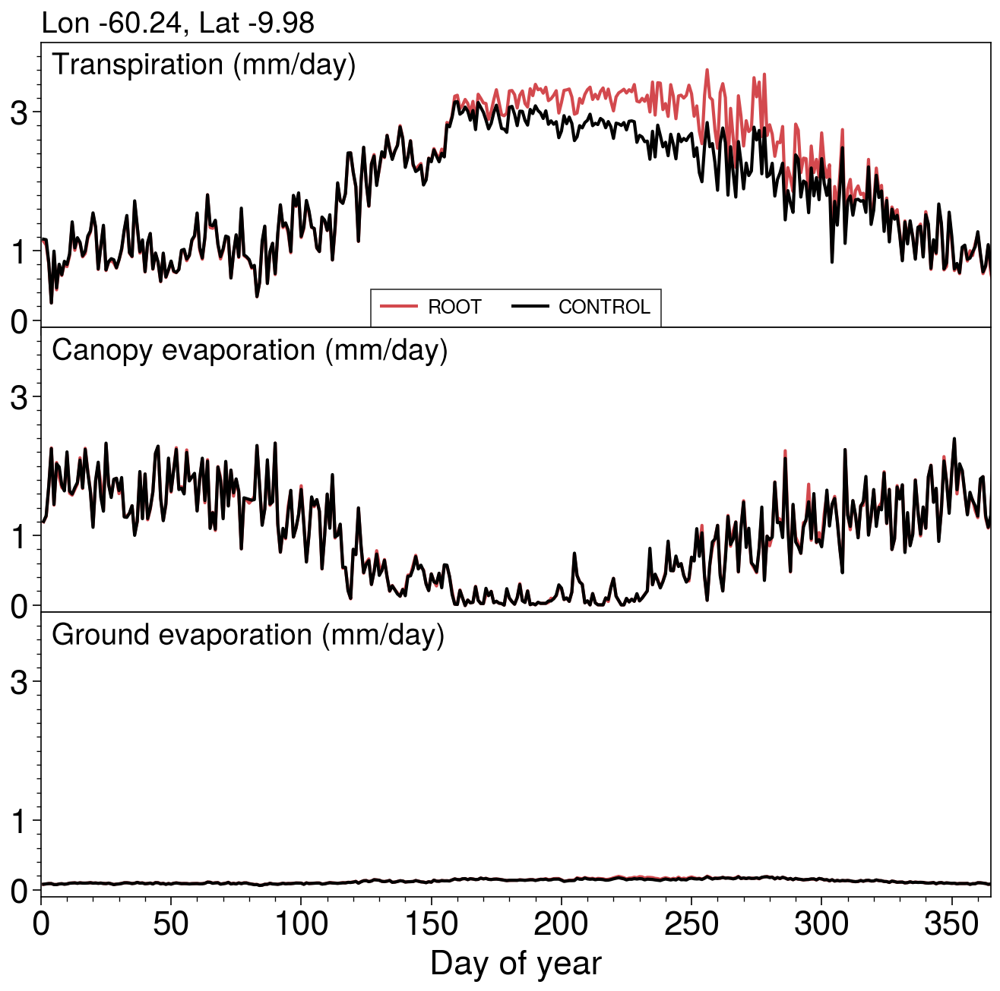

In [129]:
for x, y in [(jbrx, jbry), (fnsx, fnsy), (hx, hy), (lx, ly), (mx, my)]:

    pplt.rc['legend.fontsize']='medium'
    
    fig = pplt.figure(space=0, refwidth='50em', refheight='15em', sharey=False)
    axs = fig.subplots(nrows=3, ncols=1)

    time = doyr['dayofyear'].values

    axs[0].plot(time, doyr['ETRAN'][:,x,y].values*86400., color='faded red', label='ROOT')
    axs[0].plot(time, doyo['ETRAN'][:,x,y].values*86400., color='black', label='CONTROL')
    axs[0].legend(loc='lc')
    axs[0].format(xgrid=False, 
                  ultitle='Transpiration (mm/day)', 
                  titlesize=14, ylim=(-0.1,4), ylocator=[0,1,3],
                  ltitle='Lon ' + str(np.round(lons[x,y].values,2)) + ', Lat ' + str(np.round(lats[x,y].values,2)))
    
    axs[1].plot(time, doyr['ECAN'][:,x,y].values*86400., color='faded red')
    axs[1].plot(time, doyo['ECAN'][:,x,y].values*86400., color='black')
    axs[1].format(xgrid=False, ylim=(-0.1,4), ylocator=[0,1,3],
                  ultitle='Canopy evaporation (mm/day)', titlesize=14)
    
    axs[2].plot(time, doyr['EDIR'][:,x,y].values*86400., color='faded red')
    axs[2].plot(time, doyo['EDIR'][:,x,y].values*86400., color='black')
    axs[2].format(xgrid=False, ylim=(-0.1,4), ylocator=[0,1,3],
                  ultitle='Ground evaporation (mm/day)', titlesize=14)
    
    axs.format( 
        xlabel='Day of year', xlabelsize=16, 
        ylabelsize=16, xlim=(0,365), ygrid=False, xgrid=False)

## Medians & quantiles

In [13]:
doyr = data['roots'][['ETRAN','LH','HFX','RAINRATE']].sel(time=data['roots']['time.hour']>9).groupby('time.dayofyear').median('time')
doyo = data['original'][['ETRAN','LH','HFX']].sel(time=data['original']['time.hour']>9).groupby('time.dayofyear').median('time')

In [14]:
doyrq = data['roots'][['ETRAN','LH','HFX']].sel(time=data['roots']['time.hour']>9).groupby('time.dayofyear').quantile(q=(0.25,0.75), dim='time')
doyoq = data['original'][['ETRAN','LH','HFX']].sel(time=data['original']['time.hour']>9).groupby('time.dayofyear').quantile(q=(0.25,0.75), dim='time')

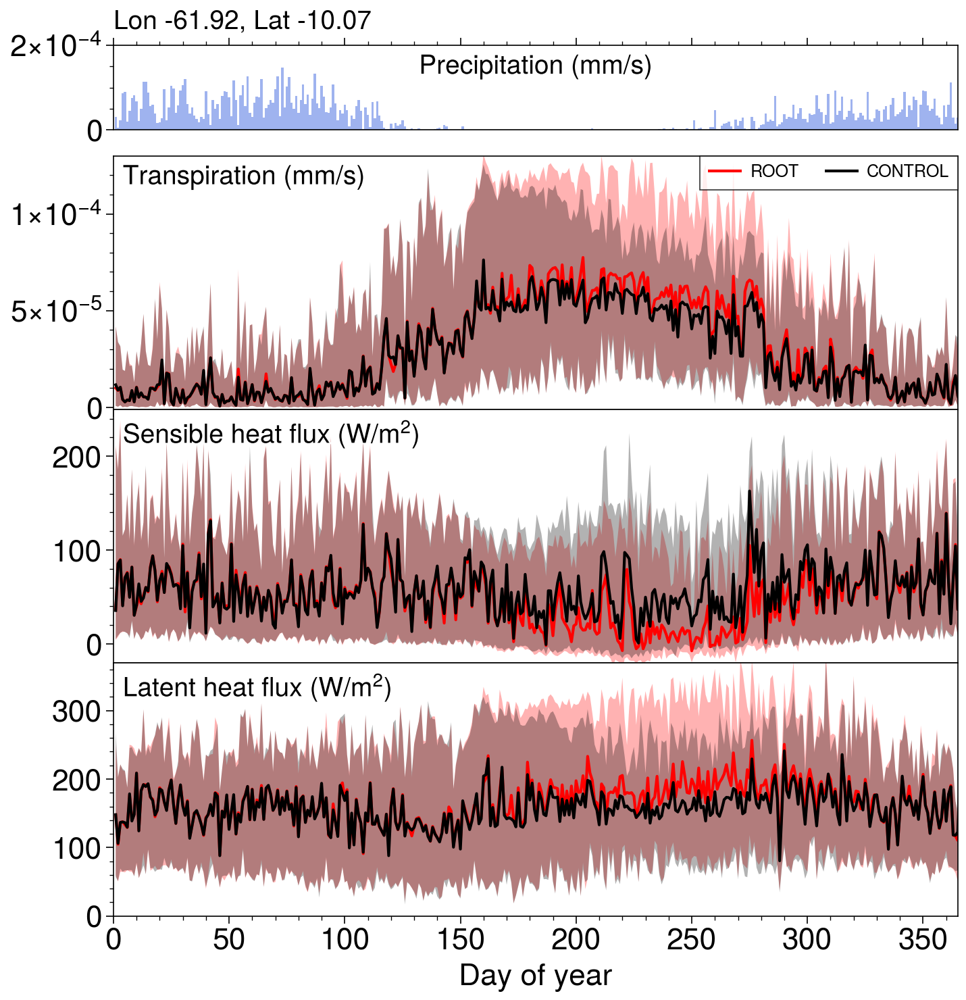

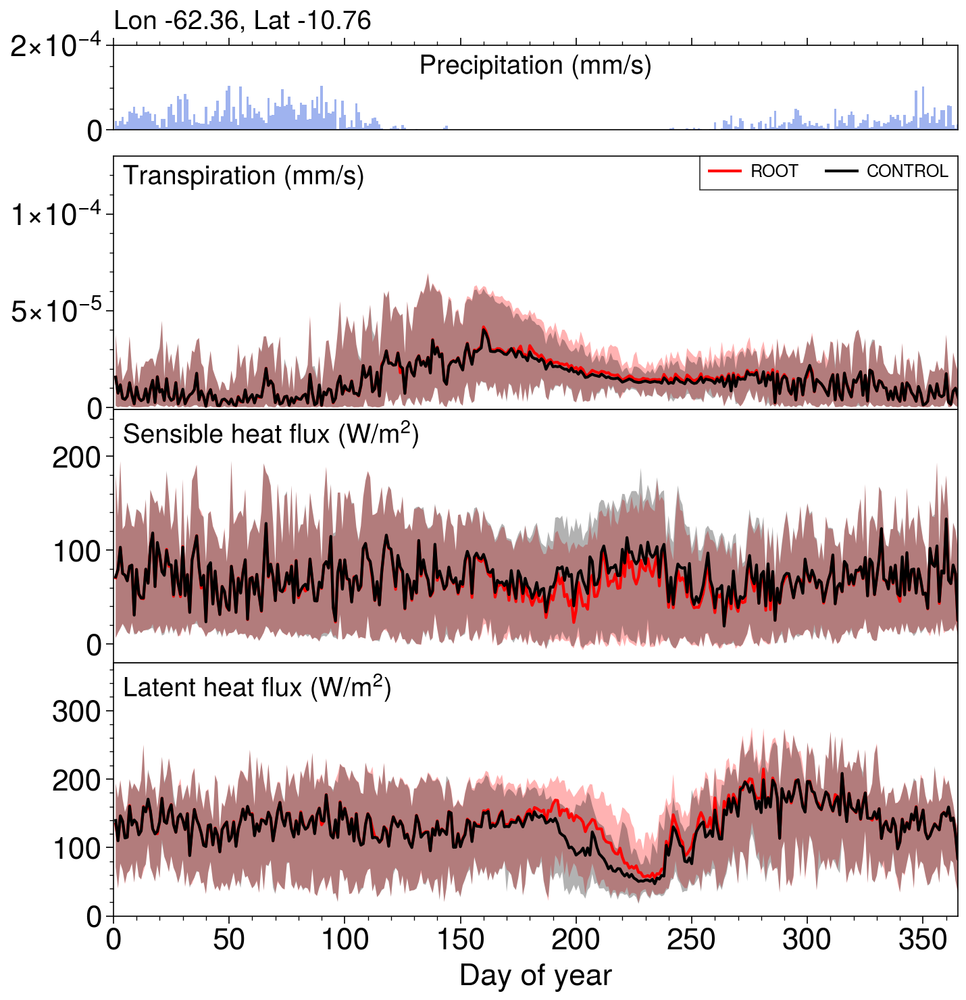

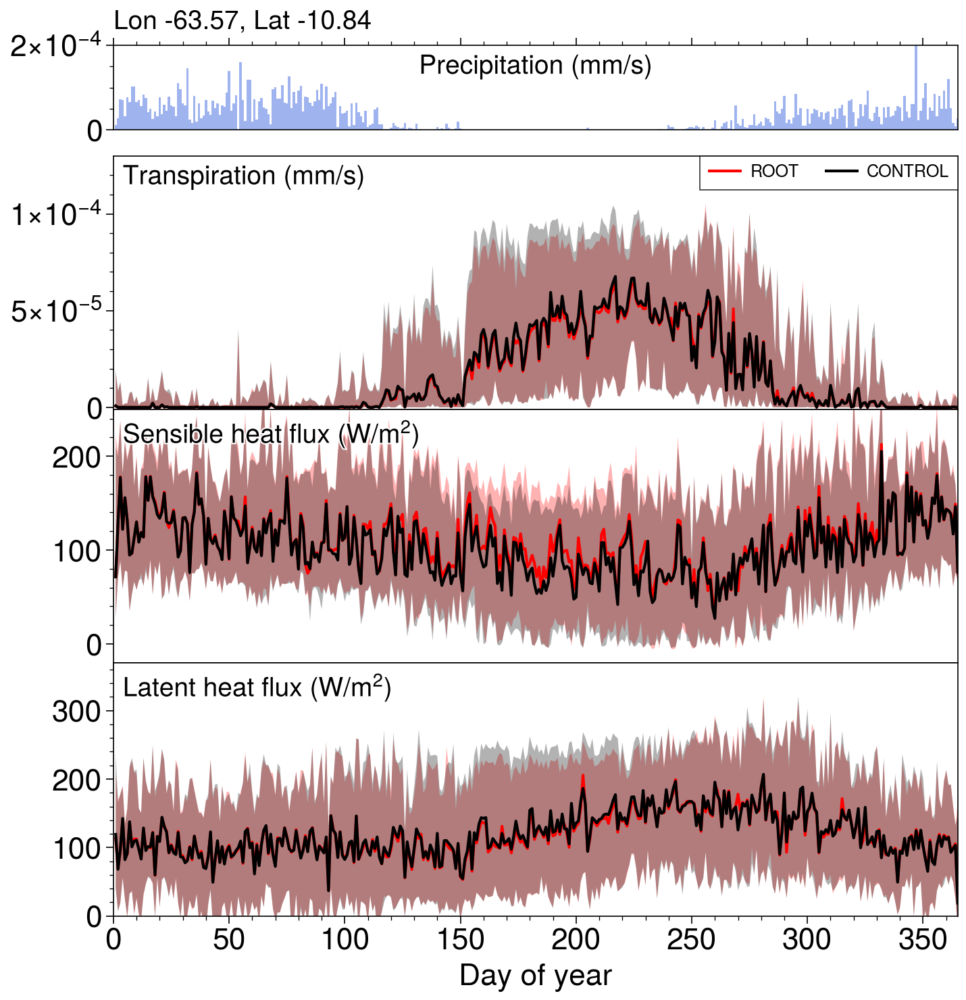

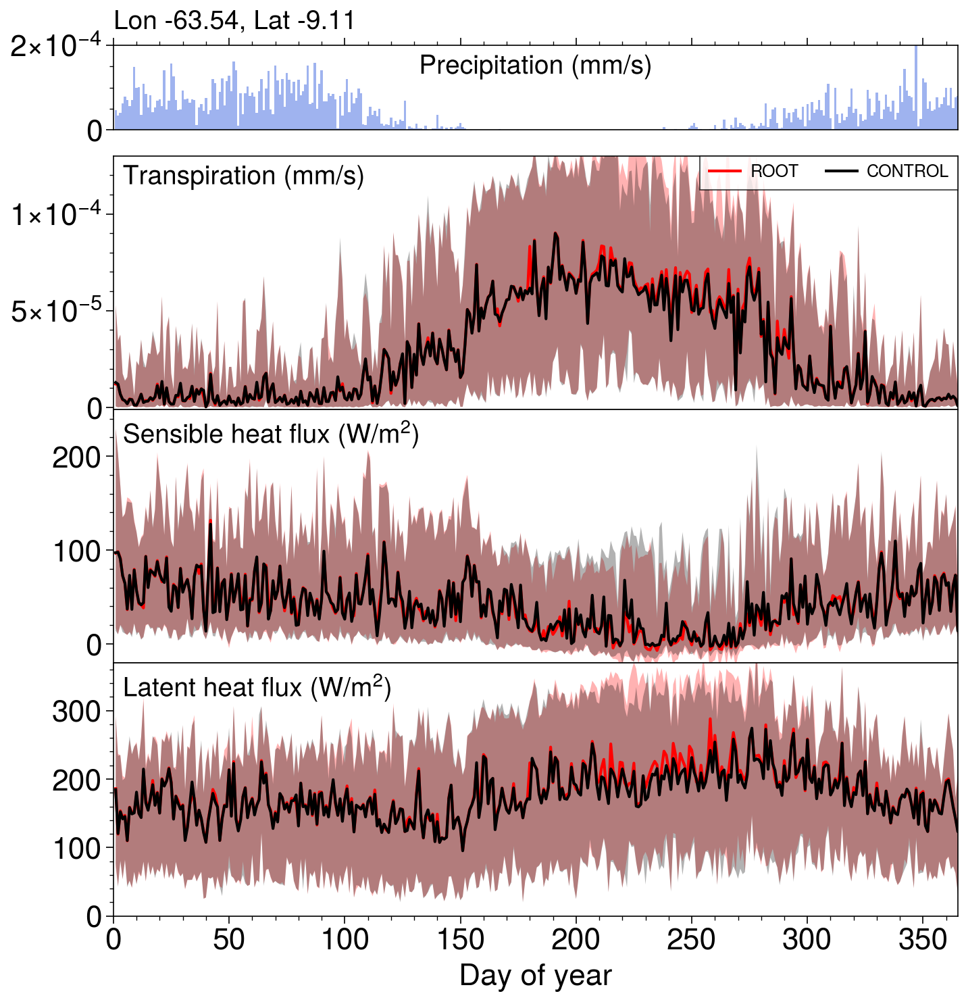

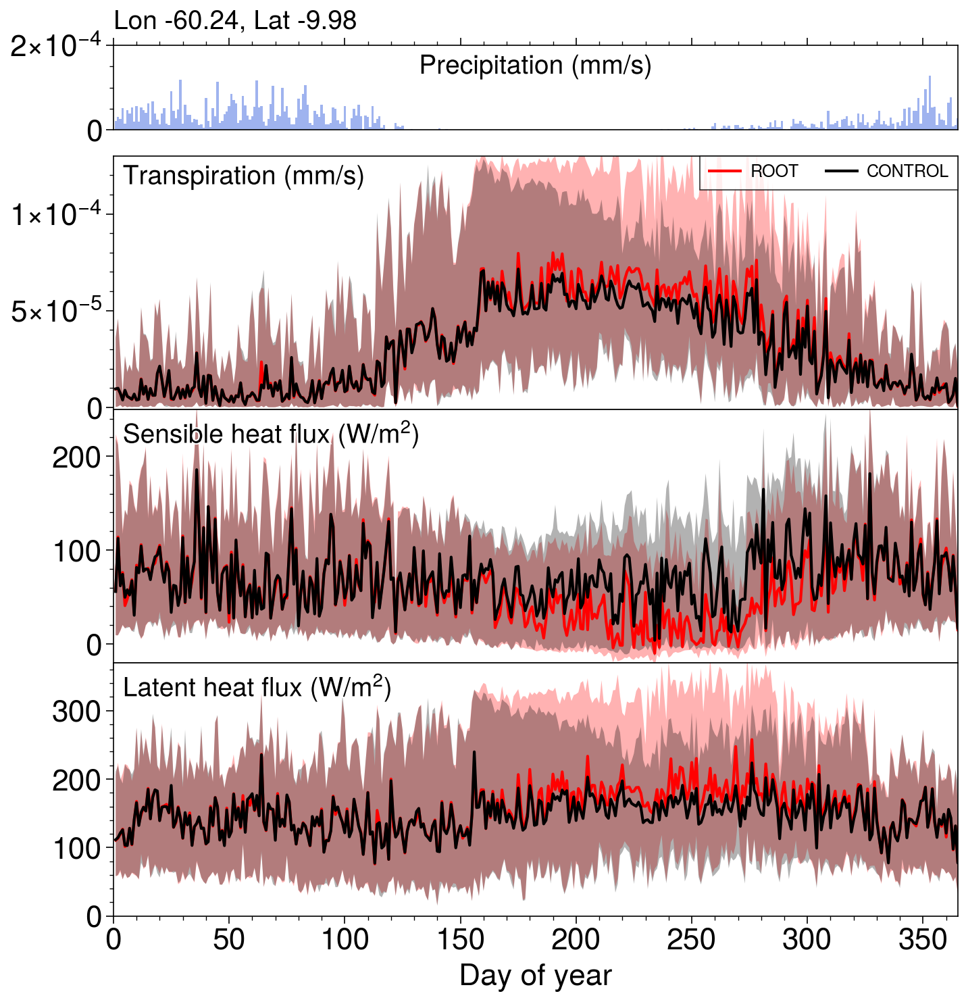

In [34]:
for x, y in [(jbrx, jbry), (fnsx, fnsy), (hx, hy), (lx, ly), (mx, my)]:

    pplt.rc['legend.fontsize']='medium'
    
    fig = pplt.figure(space=0, refwidth='50em', refheight='15em', sharey=False)
    axs = fig.subplots(nrows=3, ncols=1)

    time = doyr['dayofyear'].values
    
    pax = axs[0].panel_axes('t', width='10en')
    #ty  = axs[0].alty(color='royalblue', label='mm/s')
    pax.bar(time, doyr['RAINRATE'][:,x,y].values, color='royalblue', width=1, alpha=0.5)
    pax.format(ylim=(0,2e-4), ylocator=[0,2e-4], yformatter='sci', uctitle='Precipitation (mm/s)', 
               titlesize=14, xgrid=False)

    axs[0].plot(time, doyr['ETRAN'][:,x,y].values, color='red', label='ROOT', shadedata=doyrq['ETRAN'][:,:,x,y].T, shadealpha=0.3)
    axs[0].plot(time, doyo['ETRAN'][:,x,y].values, color='black', label='CONTROL', shadedata=doyoq['ETRAN'][:,:,x,y].T, shadealpha=0.3)
    axs[0].legend(loc='ur')
    axs[0].format(ylim=(-1e-6, 1.3e-4), xgrid=False, 
                  ylocator=[0,5e-5,1e-4], ultitle='Transpiration (mm/s)', yformatter='sci', 
                  titlesize=14, ygrid=False,
                  ltitle='Lon ' + str(np.round(lons[x,y].values,2)) + ', Lat ' + str(np.round(lats[x,y].values,2)))
    
    axs[1].plot(time, doyr['HFX'][:,x,y].values, color='red', shadedata=doyrq['HFX'][:,:,x,y].T, shadealpha=0.3)
    axs[1].plot(time, doyo['HFX'][:,x,y].values, color='black', shadedata=doyoq['HFX'][:,:,x,y].T, shadealpha=0.3)
    axs[1].format(ylim=(-20, 250), xgrid=False, 
                   ylocator=[0,100,200], ultitle='Sensible heat flux ($W/m^2$)', titlesize=14, ygrid=False)
    
    axs[2].plot(time, doyr['LH'][:,x,y].values, color='red', shadedata=doyrq['LH'][:,:,x,y].T, shadealpha=0.3)
    axs[2].plot(time, doyo['LH'][:,x,y].values, color='black', shadedata=doyoq['LH'][:,:,x,y].T, shadealpha=0.3)
    axs[2].format(ylim=(0, 370), xgrid=False, 
                   ylocator=[0,100,200,300], ultitle='Latent heat flux ($W/m^2$)', titlesize=14, ygrid=False)
    
    axs.format( 
        suptitlecolor='gray7', suptitlesize=18, xlabel='Day of year', xlabelsize=16, ylabelsize=16, xlim=(0,365)
        )

## Area plots

In [24]:
seasr = data['roots'][['LH','HFX']].groupby('time.season').mean('time')
seass = data['soil'][['LH','HFX']].groupby('time.season').mean('time')
seaso = data['original'][['LH','HFX']].groupby('time.season').mean('time')

KeyboardInterrupt: 

In [69]:
diffr = seasr-seaso
diffs = seass-seaso

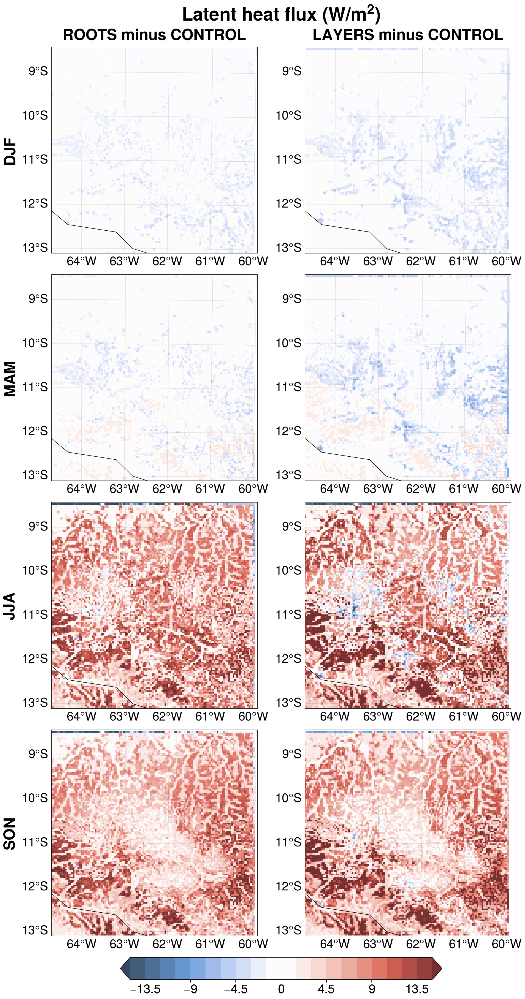

In [143]:
# Create a figure
fig = pplt.figure(refwidth='30em')
# Set the GeoAxes to the projection used by WRF
ax = fig.subplots(nrows=4, ncols=2, projection=cart_proj)

seasons = ['DJF','MAM','JJA','SON']

for i in range(4):
    

    pc = ax[i, 0].pcolormesh(to_np(lons), to_np(lats), diffr['LH'].where(diffr['LH']>-1000).sel(season=seasons[i]).values, 
                    cmap='NegPos', transform=crs.PlateCarree(), vmin=-15,vmax=15, shading='auto', levels=20, 
                    extend='both', cmap_kw={'cut': -0.025})
    
    pc = ax[i, 1].pcolormesh(to_np(lons), to_np(lats), diffs['LH'].where(diffr['LH']>-1000).sel(season=seasons[i]).values, 
                    cmap='NegPos', transform=crs.PlateCarree(), vmin=-15,vmax=15, shading='auto',  levels=20,
                    extend='both',cmap_kw={'cut': -0.025})

fig.colorbar(pc, loc='b', shrink=0.7, width=0.4)
fig.format(borders=True, lonlim=(lons.min(),lons.max()), latlim=(lats.min(), lats.max()), 
           labels=True, leftlabels=seasons, toplabels=('ROOTS minus CONTROL','LAYERS minus CONTROL'), toplabelsize=20,
           leftlabelsize=20, suptitle='Latent heat flux ($W/m^2$)', suptitlesize=24)

    
plt.show()

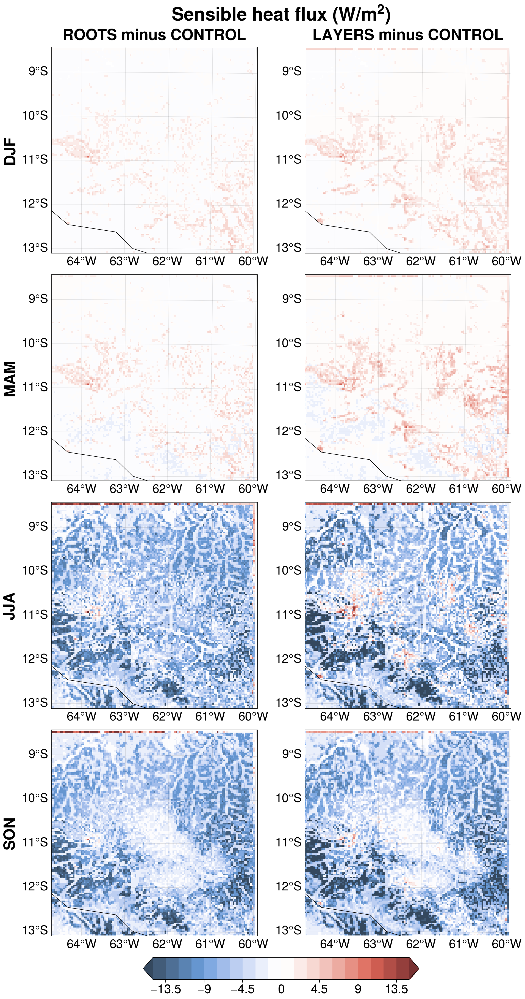

In [144]:
# Create a figure
fig = pplt.figure(refwidth='30em')
# Set the GeoAxes to the projection used by WRF
ax = fig.subplots(nrows=4, ncols=2, projection=cart_proj)

seasons = ['DJF','MAM','JJA','SON']

for i in range(4):
    

    pc = ax[i, 0].pcolormesh(to_np(lons), to_np(lats), diffr['HFX'].where(diffr['HFX']>-1000).sel(season=seasons[i]).values, 
                    cmap='NegPos', transform=crs.PlateCarree(), vmin=-15,vmax=15, shading='auto', levels=20, 
                    extend='both', cmap_kw={'cut': -0.025})
    
    pc = ax[i, 1].pcolormesh(to_np(lons), to_np(lats), diffs['HFX'].where(diffr['HFX']>-1000).sel(season=seasons[i]).values, 
                    cmap='NegPos', transform=crs.PlateCarree(), vmin=-15,vmax=15, shading='auto', levels=20,
                    extend='both',cmap_kw={'cut': -0.025})

fig.colorbar(pc, loc='b', shrink=0.6, width=0.4)
fig.format(borders=True, lonlim=(lons.min(),lons.max()), latlim=(lats.min(), lats.max()), 
           labels=True, leftlabels=seasons, toplabels=('ROOTS minus CONTROL','LAYERS minus CONTROL'), 
           toplabelsize=20, leftlabelsize=20, suptitle='Sensible heat flux ($W/m^2$)', suptitlesize=24)

    
plt.show()

In [20]:
def is_jjas(month):
    return (month >= 6) & (month <= 9)

In [21]:
def is_ndjf(month):
    return (month >= 11)  (month <= 2)

In [85]:
dryr = data['roots'][['LH','HFX']].sel(time=is_jjas(data['roots']['time.month']))
drys = data['soil'][['LH','HFX']].sel(time=is_jjas(data['soil']['time.month']))
dryo = data['original'][['LH','HFX']].sel(time=is_jjas(data['original']['time.month']))

In [86]:
drydiff = dryr-dryo

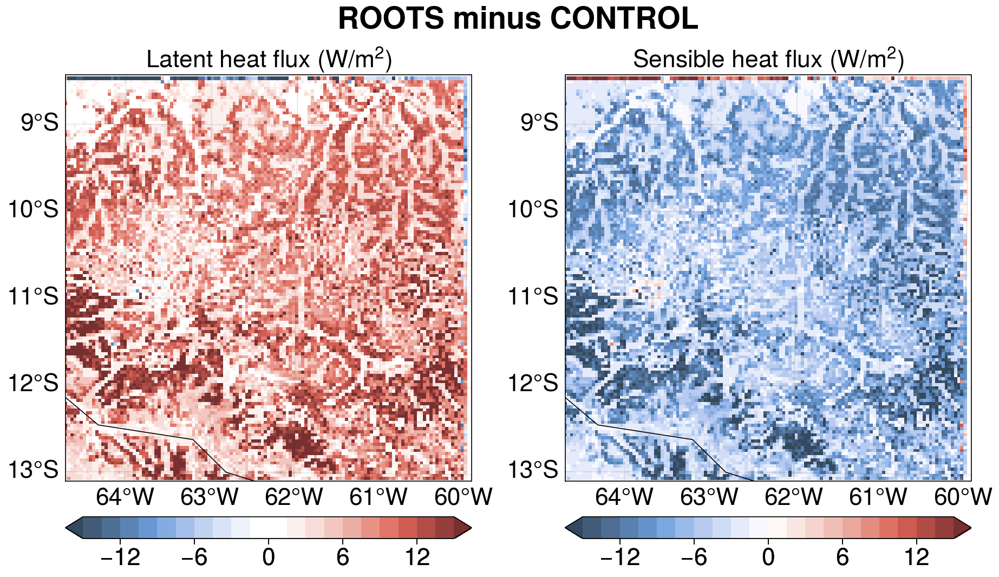

In [152]:
# Create a figure
fig = pplt.figure(refwidth='30em')
# Set the GeoAxes to the projection used by WRF
ax = fig.subplots(ncols=2, projection=cart_proj)

pc = ax[0].pcolormesh(to_np(lons), to_np(lats), drydiff['LH'].mean(dim='time').values, cmap='NegPos', 
                    transform=crs.PlateCarree(), vmin=-15,vmax=15, shading='auto', levels=20, colorbar='b', 
                    extend='both', cmap_kw={'cut': -0.05})
ax[0].format(title='Latent heat flux ($W/m^2$)', titlesize=16)

pc = ax[1].pcolormesh(to_np(lons), to_np(lats), drydiff['HFX'].mean(dim='time').values, cmap='NegPos', 
                    transform=crs.PlateCarree(), vmin=-15,vmax=15, shading='auto',  levels=20, colorbar='b', 
                    extend='both')
ax[1].format(title='Sensible heat flux ($W/m^2$)', titlesize=16)

ax.format(borders=True, lonlim=(lons.min(),lons.max()), latlim=(lats.min(), lats.max()), 
          suptitle='ROOTS minus CONTROL', suptitlesize=20, labels=True)


plt.show()

In [81]:
wetr = data['roots'][['LH','HFX']].sel(time=is_ndjf(data['roots']['time.month']))
weto = data['original'][['LH','HFX']].sel(time=is_ndjf(data['original']['time.month']))

In [92]:
wetdiff = wetr-weto

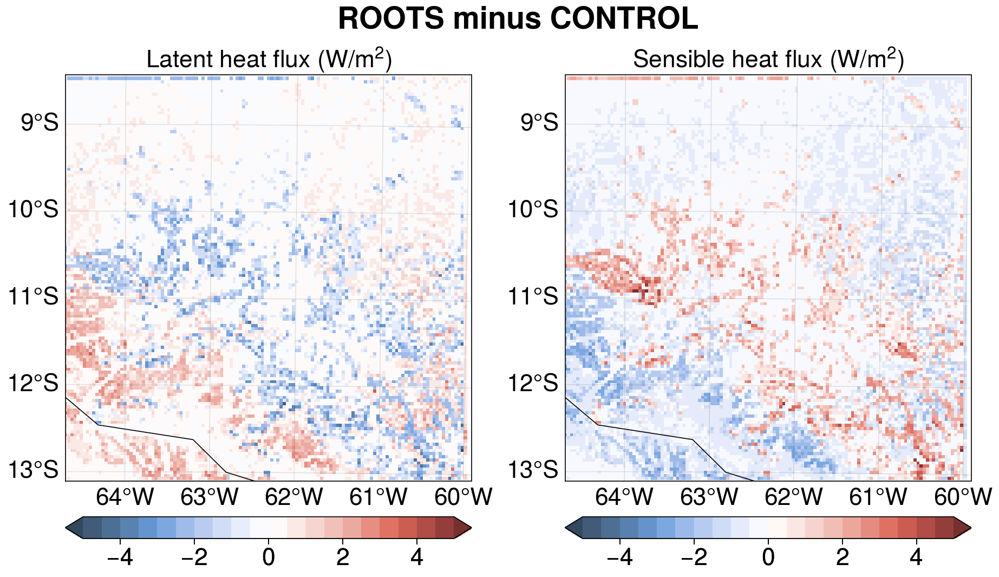

In [97]:
# Create a figure
fig = pplt.figure(refwidth='30em')
# Set the GeoAxes to the projection used by WRF
ax = fig.subplots(ncols=2, projection=cart_proj)

pc = ax[0].pcolormesh(to_np(lons), to_np(lats), wetdiff['LH'].mean(dim='time').values, cmap='NegPos', 
                    transform=crs.PlateCarree(), vmin=-5,vmax=5, shading='auto', levels=20, colorbar='b', 
                    extend='both', cmap_kw={'cut': -0.01})
ax[0].format(title='Latent heat flux ($W/m^2$)', titlesize=16)

pc = ax[1].pcolormesh(to_np(lons), to_np(lats), wetdiff['HFX'].mean(dim='time').values, cmap='NegPos', 
                    transform=crs.PlateCarree(), vmin=-5,vmax=5, shading='auto',  levels=20, colorbar='b', 
                    extend='both')
ax[1].format(title='Sensible heat flux ($W/m^2$)', titlesize=16)

ax.format(borders=True, lonlim=(lons.min(),lons.max()), latlim=(lats.min(), lats.max()), 
          suptitle='ROOTS minus CONTROL', suptitlesize=20, labels=True)


plt.show()

In [175]:
zwtmean = data['roots']['ZWT'].where(data['roots']['ZWT'] > -500).mean(dim='time')

zwtdry  = data['roots']['ZWT'].sel(time=is_jjas(data['roots']['time.month']))
zwtdry  = zwtdry.where(data['roots']['ZWT'] > -500).mean(dim='time')

zwtwet  = data['roots']['ZWT'].sel(time=is_ndjf(data['roots']['time.month']))
zwtwet  = zwtwet.where(data['roots']['ZWT'] > -500).mean(dim='time')

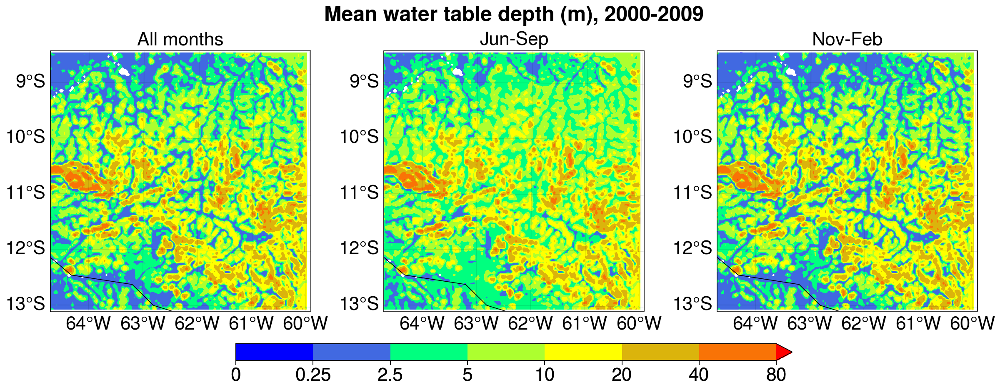

In [181]:
# Create a figure
fig = pplt.figure(refwidth='25em')
# Set the GeoAxes to the projection used by WRF
ax = fig.subplots(ncols=3, projection=cart_proj)

cmap = mpl.colors.ListedColormap(['blue', 'royalblue', 'springgreen', 'greenyellow',
                                  'yellow', 'gold','orange','red'])

levels = np.array((0,0.25, 2.5, 5, 10, 20, 40, 80))
norm = mpl.colors.BoundaryNorm(levels,len(levels)-1)

m = ax[0].contourf(to_np(lons), to_np(lats), -1*zwtmean,
             transform=crs.PlateCarree(),
             cmap=cmap, norm=norm, extend='max')
ax[0].format(title='All months', titlesize=16)

m = ax[1].contourf(to_np(lons), to_np(lats), -1*zwtdry,
             transform=crs.PlateCarree(),
             cmap=cmap, norm=norm, extend='max')
ax[1].format(title='Jun-Sep', titlesize=16)

m = ax[2].contourf(to_np(lons), to_np(lats), -1*zwtwet,
             transform=crs.PlateCarree(),
             cmap=cmap, norm=norm, extend='max')
ax[2].format(title='Nov-Feb', titlesize=16)

ax.format(borders=True, lonlim=(lons.min(),lons.max()), latlim=(lats.min(), lats.max()), 
          suptitle='Mean water table depth (m), 2000-2009', suptitlesize=18, labels=True
          )

fig.colorbar(m, loc='b', shrink=0.6, label='')

plt.show()


In [173]:
rdmean = masked['GWRD'].where(data['roots']['ZWT'] > -500).mean(dim='time')

rddry  = masked['GWRD'].sel(time=is_jjas(data['roots']['time.month']))
rddry  = rddry.where(data['roots']['ZWT'] > -500).mean(dim='time')

rdwet  = masked['GWRD'].sel(time=is_ndjf(data['roots']['time.month']))
rdwet  = rdwet.where(data['roots']['ZWT'] > -500).mean(dim='time')

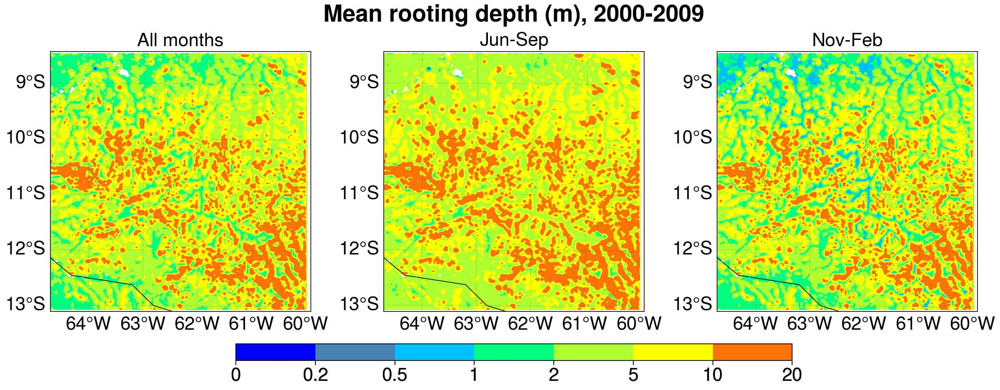

In [177]:
# Create a figure
fig = pplt.figure(refwidth='25em')
# Set the GeoAxes to the projection used by WRF
ax = fig.subplots(ncols=3, projection=cart_proj)

cmap = mpl.colors.ListedColormap(['blue', 'steelblue', 'deepskyblue', 'springgreen', 'greenyellow',
                                  'yellow','orange'])

levels = np.array((0.0, 0.2, 0.5, 1, 2, 5, 10, 20))
norm = mpl.colors.BoundaryNorm(levels,len(levels))

m = ax[0].contourf(to_np(lons), to_np(lats), rdmean,
             transform=crs.PlateCarree(),
             cmap=cmap, norm=norm)
ax[0].format(title='All months', titlesize=16)

m = ax[1].contourf(to_np(lons), to_np(lats), rddry,
             transform=crs.PlateCarree(),
             cmap=cmap, norm=norm)
ax[1].format(title='Jun-Sep', titlesize=16)

m = ax[2].contourf(to_np(lons), to_np(lats), rdwet,
             transform=crs.PlateCarree(),
             cmap=cmap, norm=norm)
ax[2].format(title='Nov-Feb', titlesize=16)

ax.format(borders=True, lonlim=(lons.min(),lons.max()), latlim=(lats.min(), lats.max()), 
          suptitle='Mean rooting depth (m), 2000-2009', suptitlesize=20, labels=True
          )

fig.colorbar(m, loc='b', shrink=0.6, label='')

plt.show()

## Plot points and domain

In [54]:
topo  = getvar(Dataset(geogrid),'HGT_M')
luse  = getvar(Dataset(geogrid),'LU_INDEX')
sltyp = getvar(Dataset(wrf_path),'ISLTYP')

/glade/work/cab478/conda-envs/my-npl-ml/lib/python3.7/site-packages/cartopy/mpl/style.py:76: UserWarning: facecolor will have no effect as it has been defined as "never".
  warnings.warn('facecolor will have no effect as it has been '


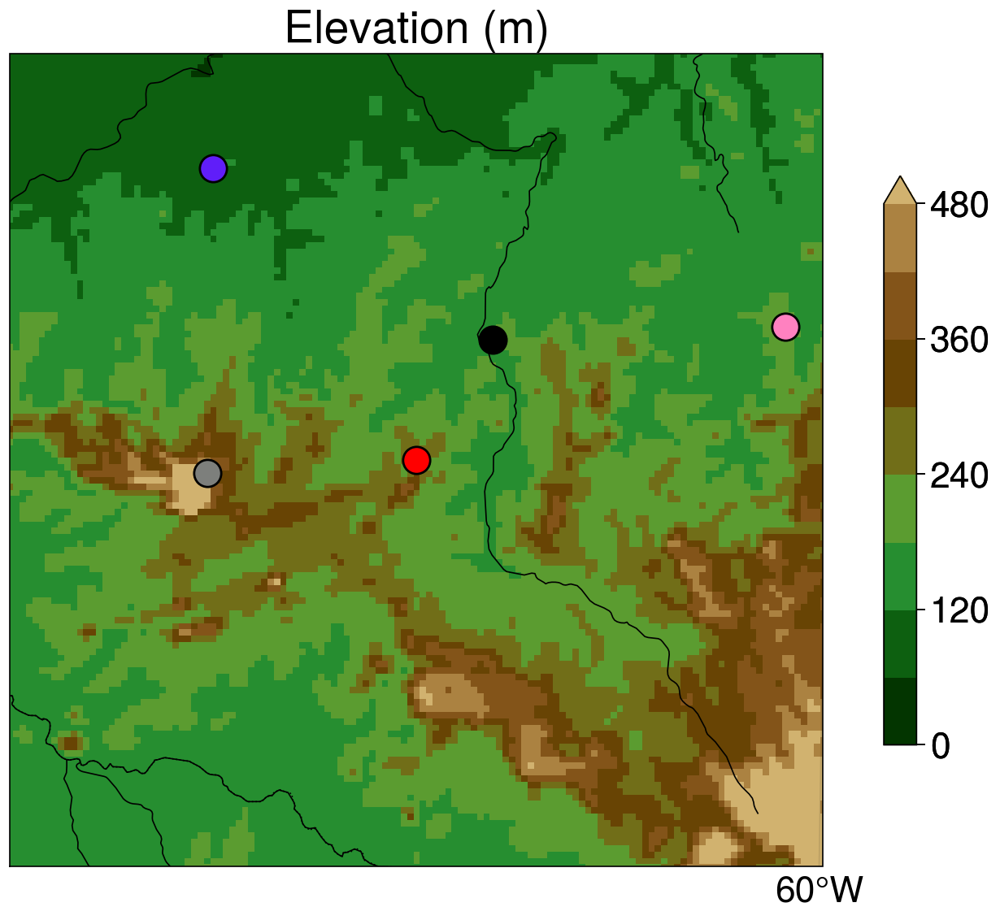

In [47]:
# Create a figure
fig = pplt.figure(refwidth='40em')
# Set the GeoAxes to the projection used by WRF
ax = plt.axes(projection=get_cartopy(topo))

pplt.rc['tick.labelsize'] = 16

cmap=pplt.Colormap(('Dark Green' ,'Medium Green', 'Brown', 'Tan'))

pc = plt.pcolormesh(to_np(lons), to_np(lats), topo, cmap=cmap, transform=crs.PlateCarree(), vmin=0, vmax=500, 
                    levels=9, extend='max')

plt.plot(to_np(lons[jbrx,jbry]),to_np(lats[jbrx,jbry]), marker='o', color = 'black', edgecolor='black', 
         markersize=12, transform=crs.PlateCarree())
plt.plot(to_np(lons[fnsx,fnsy]),to_np(lats[fnsx,fnsy]), marker='o', color = 'red',  edgecolor='black',
         markersize=12, transform=crs.PlateCarree())
plt.plot(to_np(lons[hx,hy]),to_np(lats[hx,hy]), marker='o', color = 'medium grey',  edgecolor='black',
         markersize=12, transform=crs.PlateCarree())
plt.plot(to_np(lons[lx,ly]),to_np(lats[lx,ly]), marker='o', color = 'purple blue',  edgecolor='black',
         markersize=12, transform=crs.PlateCarree())
plt.plot(to_np(lons[mx,my]),to_np(lats[mx,my]), marker='o', color = 'pink',  edgecolor='black',
         markersize=12, transform=crs.PlateCarree())

cbar = plt.colorbar(pc, shrink=0.7, label='', ticks=[0,120,240,360,480])

ax.coastlines('50m', linewidth=0.8)
ax.add_feature(cfeature.BORDERS, linestyle=':')
ax.add_feature(cfeature.LAKES, color='black')
ax.add_feature(cfeature.RIVERS, color='black')

# Set the map bounds
ax.set_xlim(cartopy_xlim(topo))
ax.set_ylim(cartopy_ylim(topo))

ax.set_title('Elevation (m)', size=20)

ax.format(labels=True
          )

plt.show()

/glade/work/cab478/conda-envs/my-npl-ml/lib/python3.7/site-packages/cartopy/mpl/style.py:76: UserWarning: facecolor will have no effect as it has been defined as "never".
  warnings.warn('facecolor will have no effect as it has been '


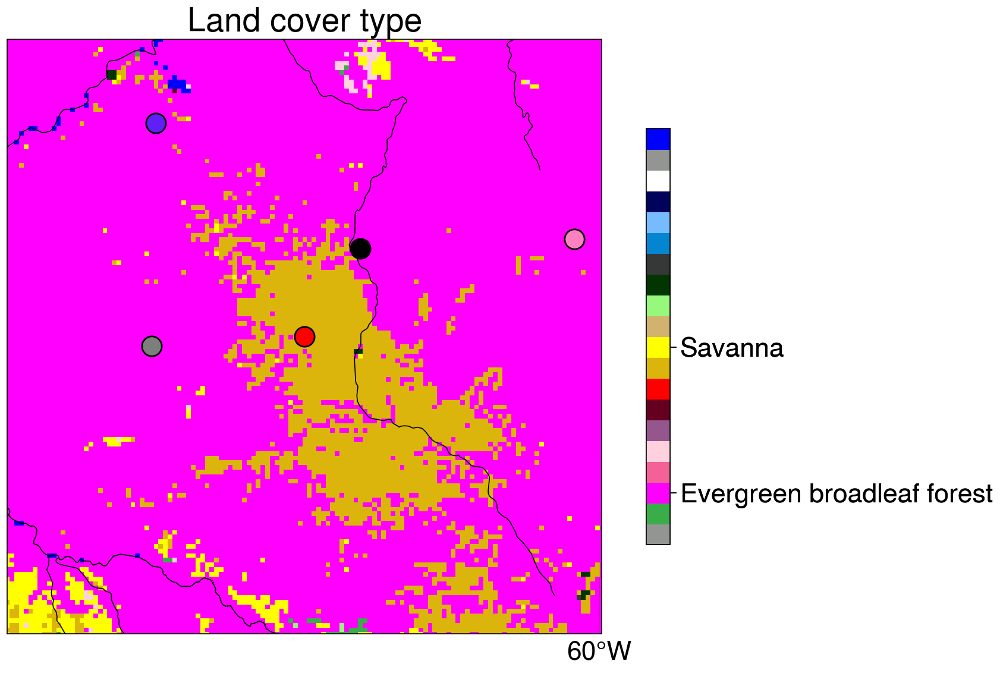

In [55]:
# Create a figure
fig = pplt.figure(refwidth='40em')
# Set the GeoAxes to the projection used by WRF
ax = plt.axes(projection=get_cartopy(luse))

pplt.rc['tick.labelsize'] = 16

colors = ['grey','medium green','magenta','medium pink','light pink','purple','maroon','red','gold','yellow','tan','light green',
          'dark green', 'dark grey', 'cerulean', 'sky blue', 'dark blue','white','grey','blue']

pc = plt.pcolormesh(to_np(lons), to_np(lats), luse, colors=colors,
                    transform=crs.PlateCarree(), 
                    levels=np.arange(21))

plt.plot(to_np(lons[jbrx,jbry]),to_np(lats[jbrx,jbry]), marker='o', color = 'black', edgecolor='black',
         markersize=12, transform=crs.PlateCarree())
plt.plot(to_np(lons[fnsx,fnsy]),to_np(lats[fnsx,fnsy]), marker='o', color = 'red', edgecolor='black',
         markersize=12, transform=crs.PlateCarree())
plt.plot(to_np(lons[hx,hy]),to_np(lats[hx,hy]), marker='o', color = 'medium grey', edgecolor='black',
         markersize=12, transform=crs.PlateCarree())
plt.plot(to_np(lons[lx,ly]),to_np(lats[lx,ly]), marker='o', color = 'purple blue', edgecolor='black',
         markersize=12, transform=crs.PlateCarree())
plt.plot(to_np(lons[mx,my]),to_np(lats[mx,my]), marker='o', color = 'pink', edgecolor='black',
         markersize=12, transform=crs.PlateCarree())

cbar = plt.colorbar(pc, shrink=0.7, label='', ticks=[2.5,9.5,20.5], ticklabels=['Evergreen broadleaf forest',
                                                                                'Savanna', 'Water'])

ax.coastlines('50m', linewidth=0.8)
ax.add_feature(cfeature.BORDERS, linestyle=':')
ax.add_feature(cfeature.LAKES,  color='black')
ax.add_feature(cfeature.RIVERS, color='black')

# Set the map bounds
ax.set_xlim(cartopy_xlim(luse))
ax.set_ylim(cartopy_ylim(luse))

ax.set_title('Land cover type', size=20)

ax.format(labels=True
          )

plt.show()

/glade/work/cab478/conda-envs/my-npl-ml/lib/python3.7/site-packages/cartopy/mpl/style.py:76: UserWarning: facecolor will have no effect as it has been defined as "never".
  warnings.warn('facecolor will have no effect as it has been '


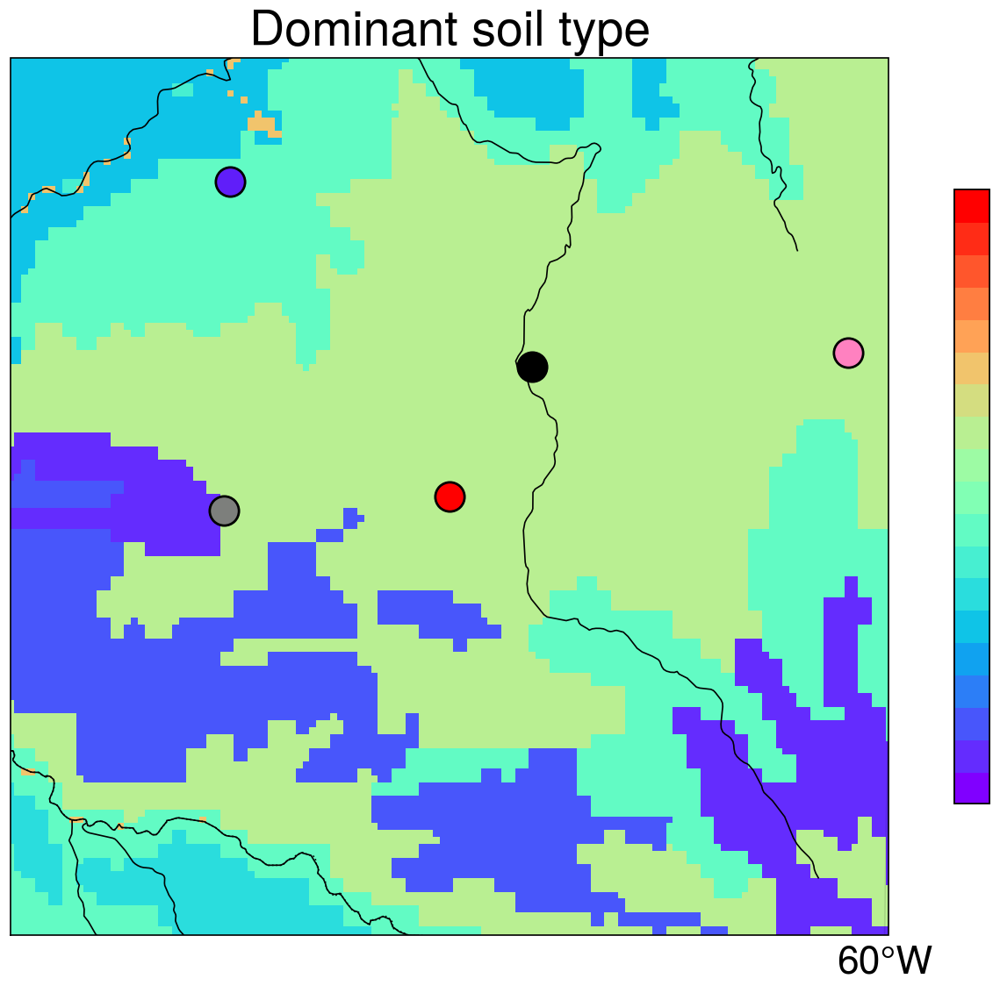

In [56]:
# Create a figure
fig = pplt.figure(refwidth='40em')
# Set the GeoAxes to the projection used by WRF
ax = plt.axes(projection=get_cartopy(sltyp))

pplt.rc['tick.labelsize'] = 16

colors = ['grey','medium green','magenta','medium pink','light pink','purple','maroon','red','gold','yellow','tan','light green',
          'dark green', 'dark grey', 'cerulean', 'sky blue', 'dark blue', 'white','grey','blue']

pc = plt.pcolormesh(to_np(lons), to_np(lats), sltyp, cmap='rainbow',
                    transform=crs.PlateCarree(), 
                    levels=np.arange(20))

plt.plot(to_np(lons[jbrx,jbry]),to_np(lats[jbrx,jbry]), marker='o', color = 'black', edgecolor='black',
         markersize=12, transform=crs.PlateCarree())
plt.plot(to_np(lons[fnsx,fnsy]),to_np(lats[fnsx,fnsy]), marker='o', color = 'red', edgecolor='black',
         markersize=12, transform=crs.PlateCarree())
plt.plot(to_np(lons[hx,hy]),to_np(lats[hx,hy]), marker='o', color = 'medium grey', edgecolor='black',
         markersize=12, transform=crs.PlateCarree())
plt.plot(to_np(lons[lx,ly]),to_np(lats[lx,ly]), marker='o', color = 'purple blue', edgecolor='black',
         markersize=12, transform=crs.PlateCarree())
plt.plot(to_np(lons[mx,my]),to_np(lats[mx,my]), marker='o', color = 'pink', edgecolor='black',
         markersize=12, transform=crs.PlateCarree())

cbar = plt.colorbar(pc, shrink=0.7, label='', ticks=[], ticklabels=[])

ax.coastlines('50m', linewidth=0.8)
ax.add_feature(cfeature.BORDERS, linestyle=':')
ax.add_feature(cfeature.LAKES,  color='black')
ax.add_feature(cfeature.RIVERS, color='black')

# Set the map bounds
ax.set_xlim(cartopy_xlim(luse))
ax.set_ylim(cartopy_ylim(luse))

ax.set_title('Dominant soil type', size=20)

ax.format(labels=True
          )

plt.show()

## Time series plots

In [ ]:
def plot_ts(data2d, lon, lat, rd=rd, kwtd=kwtd, kroot=kroot):

    fig = pplt.figure(figwidth=12, figheight=6)
    axs = fig.subplots(ncols=1)
    plt.plot(data2d['time'],-1*data2d['ZWT'][:,lon,lat], color='black', linewidth=3, label='ZWT', zorder=20)
    plt.fill_between(data2d['time'],rd[:,lon,lat],0, color='tab:cyan', alpha=0.3, label='RD', zorder=5)
    plt.plot(data2d['time'],rd[:,lon,lat], 'o', s=6, color='tab:cyan', linewidth=3, zorder=10)
    plt.plot(data2d['time'],kwtd[:,lon,lat], 'o', s=6, color='tab:blue', linewidth=3, label='KWTD', zorder=10)
    plt.fill_between(data2d['time'],kroot[:,lon,lat],0, color='grey3', alpha=0.9, label='KROOT')
    plt.legend(loc = 'lower right')

    plt.ylabel('Depth (m)')
    plt.xlabel('Time')

    plt.ylim(-0.5,50)

    kwargs={'yreverse':True}

    axs.format(
        title='Time series for lon ' + str(np.round(lons[lon,lat].values,2)) + ', lat ' + str(np.round(lats[lon,lat].values,2)), 
        titleloc='r', titlecolor='gray7', titlesize=16, xlim=(np.datetime64('2000-01-02'), np.datetime64('2002-12-31')), xrotation=0,
        ylocator=depths[::2], yminorlocator=depths, ygridminor=True, xgrid=False, gridwidth=3, gridminorwidth=3, gridcolor='grey9',
        **kwargs
    )

In [ ]:
plot_ts(data2d, jbrx, jbry)

In [ ]:
plot_ts(data2d, fnsx, fnsy)

In [ ]:
plot_ts(data2d, hx, hy)

In [ ]:
plot_ts(data2d, lx, ly)

In [ ]:
plot_ts(data2d, mx, my)

In [ ]:
rootactivity = sliced3d['ROOTACTIVITY'].mean(dim='time')

In [ ]:
goodrain = (goodrain/86400.)

In [ ]:
soilm = sliced3d['SOIL_W'].groupby('time.date').mean('time')

In [ ]:
def plot_uptake(lon, lat, uptake=uptake, rootactivity=rootactivity, kwtd=kwtd, yticks=depths, ymax=20):

    fig,axs = pplt.subplots([[1, 2], [1, 3]], wratios=(1, 2), refwidth=3, refheight=5, share=False, hspace=(0.3))

    rootactivity = rootactivity[lon,:,lat]/thick
    axs[0,0].plot(rootactivity, depths-(thick/2.), marker='o', color='black')
    axs[0,0].set_xlim(min(rootactivity), max(rootactivity))
    axs[0,0].set_xlabel(' ', fontsize=18)
    axs[0,0].set_title('Mean root activity', fontsize=18)
    axs[0,0].set_ylabel('Depth (m)', fontsize=18)
    
    cmap = pplt.Colormap('Greens')
    #cmap.set_over('grey')

    #x,y = np.meshgrid(soilm['date'],depths)
    #axs[0,1].contourf(x.T,y.T,soilm[:,lon,:,lat].values, cmap=cmap, extend='both')
    pc = axs[0,1].pcolormesh(soilm['date'],depths-(thick/2.),soilm[:,lon,:,lat].values.T,cmap=cmap, shading='auto',
                            )
    axs[0,1].area(sliced2d['time'],-1*sliced2d['ZWT'][:,lon,lat], 100, 
                  stacked=True, color='grey', label='ZWT',)
    axs[0,1].set_ylim(0,20)
    axs[0,1].colorbar(pc, label='$m^3/m^3$', shrink=0.8)
    axs[0,1].set_ylabel('Depth (m)', fontsize=18)
    axs[0,1].set_xlabel(' ')
    axs[0,1].format(ticklabelsize=12, lrtitle='Soil moisture', titlesize=14)
    px = axs[0,1].panel('t', space=0, width='7em')
    px.plot(goodrain['time'],goodrain[:,lon,lat].values)
    #px.format(xrotation=0)
    #px.set_xticks(pd.date_range('2001-01-01','2003-01-01',freq='MS')[::6])
    px.set_xlabel(' ')
    px.set_xticks([])
    px.set_yticks([5e-5])
    px.set_title('Precipitation rate')
    px.set_ylabel('mm/s')
    px.format(ticklabelsize=12, titleloc='upper right', titlesize=14)
    
    cmap = pplt.Colormap(['goldenrod','white','medium green'], listmode='continuous')
    cmap.set_under('white')
    cmap.set_over('green')
    
    #x,y = np.meshgrid(uptake['date'],depths)
    cf = axs[1,1].pcolormesh(uptake['date'],depths-(thick/2.),(uptake[:,lon,lat,:]/thick).T,cmap=cmap, shading='auto',
                            vmin=0.05,vmax=0.4)
    #cf = axs[1,1].contourf(x.T,y.T,uptake[:,lon,lat,:]/thick, cmap=cmap, cmap_kw={'cut': 0.1}, extend='both', levels=np.arange(0.05,0.45,0.05))
    axs[1,1].plot(sliced2d['time'],-1*sliced2d['ZWT'][:,lon,lat], color='black', linewidth=3, label='ZWT',)
    axs[1,1].set_ylim(0,ymax)
    axs[1,1].set_xlim(np.datetime64('2001-01-01'), np.datetime64('2002-12-31'))
    axs[1,1].set_xticks(pd.date_range('2001-01-01','2002-12-31',freq='MS')[::6])
    axs[1,1].colorbar(cf, label='mm/day per m', shrink=0.8)
    axs[1,1].format(xtickminor=False)
    axs[1,1].set_xlabel('Time', fontsize=18)
    axs[1,1].set_ylabel('Depth (m)', fontsize=18)
    axs[1,1].format(xrotation=0, yticklabelsize=12, lrtitle='Uptake & WTD', titlesize=14)
    
    kwargs={'yreverse':True}

    axs.format(
        suptitle='Time series for lon ' + str(np.round(lons[lon,lat].values,2)) + ', lat ' + str(np.round(lats[lon,lat].values,2)), 
        suptitlecolor='gray7', suptitlesize=18,
        ylocator=yticks[::2][1:], yminorlocator=depths, ygridminor=True, ygrid=True, xgrid=False, gridwidth=3, gridminorwidth=3, gridcolor='grey9',
        xrotation=0,
        **kwargs
    )


In [ ]:
plot_uptake(hx, hy, yticks=np.asarray([0.1, 0.4, 1.0, 2.0, 3.0, 4.0, 6.0, 8.0, 10.0, 12.0, 15.0, 20.0, 35.0]), ymax=40)

In [ ]:
plot_uptake(jbrx, jbry)

In [ ]:
plot_uptake(fnsx, fnsy)

In [ ]:
plot_uptake(mx, my)

In [ ]:
plot_uptake(lx, ly)

## Area plots

In [ ]:
zwt = data2d['ZWT'].sel(time=slice('2001-01-01','2002-12-31')).mean(dim='time')
zwt = zwt.where(zwt > -100)

In [ ]:
# Create a figure
fig = plt.figure(figsize=(12,12))
# Set the GeoAxes to the projection used by WRF
ax = plt.axes(projection=cart_proj)

cmap = mpl.colors.ListedColormap(['blue', 'royalblue', 'springgreen', 'greenyellow',
                                  'yellow', 'gold','orange','red'])

levels = np.array((0,0.25, 2.5, 5, 10, 20, 40, 80))
#levels = np.array((80, 40, 20, 10, 5, 2.5, 0.25, 0))
norm = mpl.colors.BoundaryNorm(levels,len(levels)-1)

ax.coastlines('50m', linewidth=0.8)

cf = plt.contourf(to_np(lons), to_np(lats), zwt*-1, levels=levels,
             transform=crs.PlateCarree(),
             cmap=cmap, extend='max', norm=norm)

# Add a color bar
cbar = plt.colorbar(shrink=.98)
cbar.ax.tick_params(labelsize=20)
cbar.set_label('Water table depth (m)', fontsize=25)
cbar.ax.minorticks_off()

# Set the map bounds
ax.set_xlim(cartopy_xlim(dummy))
ax.set_ylim(cartopy_ylim(dummy))

plt.show()

## Plot profiles

In [ ]:
def plot_profiles(data2d, data3d, lat, lon, kroot=kroot, kwtd=kwtd, rd=rd, beginning=False):

    if beginning:
        psi    = data3d['PSI'][:10,lat,:,lon]
        soil_w = data3d['SOIL_W'][:10,lat,:,lon]
        easy   = data3d['EASY'][:10,lat,:,lon]
        root   = data3d['ROOTACTIVITY'][:10,lat,:,lon]
        kroot  = kroot[:10,lat,lon]
        kwtd   = kwtd[:10,lat,lon]
        rd     = rd[:10,lat,lon]
        zwt    = -1*data2d['ZWT'][:10,lat,lon]
        time   = np.datetime_as_string(data2d['time'].values[:10])
        
    else:
        psi    = data3d['PSI'][-10:,lat,:,lon]
        soil_w = data3d['SOIL_W'][-10:,lat,:,lon]
        easy   = data3d['EASY'][-10:,lat,:,lon]
        root   = data3d['ROOTACTIVITY'][-10:,lat,:,lon]
        kroot  = kroot[-10:,lat,lon]
        kwtd   = kwtd[-10:,lat,lon]
        rd     = rd[-10:,lat,lon]
        zwt    = -1*data2d['ZWT'][-10:,lat,lon]
        time   = np.datetime_as_string(data2d['time'].values[-10:])
    
    fig = pplt.figure(share=False)
    axs = fig.subplots(nrows=2, ncols=5) 
    pxs = axs.panel('r', space=0, width=3)
    
    for i in range(10):
        
        axs[i].plot(soil_w.values[i,:], depths, color='tab:green', marker='o')
        axs[i].set_ylim(20,0)
        soilr = max(soil_w[i,:])-min(soil_w[i,:])
        xmin=min(soil_w[i,:])-(soilr/4.)
        xmax=max(soil_w[i,:])+(soilr/4.)
        axs[i].set_xlim(xmin, xmax)
        axs[i].set_ylabel('Depth')
        axs[i].format(xcolor='tab:green')
        axs[i].set_xlabel('SOIL_W ($m^{3}/m^{3}$)', color='tab:green')

        axs[i].hlines(zwt[i],
                      xmin, xmax,
                      linestyle='--', label='ZWT')
        axs[i].hlines(kwtd[i],
                      xmin, xmax,
                      linestyle='--', color='tab:pink', label='KWTD')
        axs[i].hlines(rd[i],
                      xmin, xmax,
                      linestyle='--', color='tab:olive', label='RD')
        axs[i].hlines(kroot[i],
                      xmin, xmax,
                      linestyle='--', color='tab:red', label='KROOT')
        
        
        axs[i].legend()
        
        axs[i].format(title=time[i][:13], titlesize=16)

        
        ox = axs[i].altx(color='tab:blue', label='PSI (m)', linewidth=1)
        ox.plot(psi[i,:].values, depths, color='tab:blue', marker='o')
        psir = max(psi[i,:])-min(psi[i,:])
        xmin=min(psi[i,:])-(psir/4.)
        xmax=max(psi[i,:])+(psir/4.)
        ox.set_xlim(xmin, xmax)
        
        
        pxs[i].plot(easy[i,:].values, depths, color='tab:orange',marker='o')
        pxs[i].set_ylim(20,0)
        easyr = max(easy[i,:])-min(easy[i,:])
        xmin=min(easy[i,:])-(easyr/4.)
        xmax=max(easy[i,:])+(easyr/4.)
        pxs[i].set_xlim(xmin, xmax)
        pxs[i].set_xlabel('EASE', color='tab:orange')
        pxs[i].set_ylabel('Depth')
        pxs[i].format(xcolor='tab:orange')

        pxs[i].hlines(zwt[i],
                      xmin, xmax,
                      linestyle='--', label='ZWT')
        pxs[i].hlines(kwtd[i],
                      xmin, xmax,
                      linestyle='--', color='tab:pink', label='KWTD')
        pxs[i].hlines(rd[i],
                      xmin, xmax,
                      linestyle='--', color='tab:olive', label='RD')
        pxs[i].hlines(kroot[i],
                      xmin, xmax,
                      linestyle='--', color='tab:red', label='KROOT')

        ox = pxs[i].altx(color='tab:purple', label='ROOT', linewidth=1)
        ox.plot(root[i,:].values/thick, depths, color='tab:purple', marker='o')
        rootr = max(root[i,:])-min(root[i,:])
        xmin=min(root[i,:])-(rootr/4.)
        xmax=max(root[i,:])+(rootr/4.)
        ox.set_xlim(xmin,xmax)
    
    plt.show()

In [ ]:
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)

In [ ]:
plot_profiles(data2d, data3d, jbrx, jbry)

In [ ]:
plot_profiles(data2d, data3d, fnsx, fnsy)

In [ ]:
plot_profiles(data2d, data3d, hx, hy)

In [ ]:
plot_profiles(data2d, data3d, lx, ly)

In [ ]:
plot_profiles(data2d, data3d, mx, my)

## Plot MM & F data

In [ ]:
url = 'https://wci.earth2observe.eu/thredds/dodsC/usc/root-depth/maxroot_South_America_CF.nc'
ds = xr.open_dataset(url, engine='netcdf4') 

In [ ]:
# Create a figure
fig = plt.figure(figsize=(12,12))
# Set the GeoAxes to the projection used by WRF
ax = plt.axes(projection=cart_proj)

cmap = mpl.colors.ListedColormap(['blue', 'steelblue', 'deepskyblue', 'springgreen', 'greenyellow',
                                  'yellow','orange'])

levels = np.array((0.0, 0.2, 0.5, 1, 2, 5, 10, 20))
#levels = np.array((80, 40, 20, 10, 5, 2.5, 0.25, 0))
norm = mpl.colors.BoundaryNorm(levels,len(levels))

ax.coastlines('50m', linewidth=0.8)

cf = plt.contourf(to_np(lons), to_np(lats), 
                  ds['root_depth'].sel(lon=lons[0,:].values, 
                                       method='nearest').sel(lat=lats[:,0].values, method='nearest'), 
                  levels=levels, extend='max',
                  transform=crs.PlateCarree(),
                  cmap=cmap, norm=norm)

# Add a color bar
cbar = plt.colorbar(shrink=.98)
cbar.ax.tick_params(labelsize=20)
cbar.set_label('Rooting depth (m)', fontsize=25)
cbar.ax.minorticks_off()

# Set the map bounds
#ax.set_xlim(cartopy_xlim(zwt))
#ax.set_ylim(cartopy_ylim(zwt))

plt.show()

In [ ]:
url = 'https://wci.earth2observe.eu/thredds/dodsC/usc/water-table-depth/wtd_South_America_CF.nc'
ds = xr.open_dataset(url, engine='netcdf4') 

In [ ]:
# Create a figure
fig = plt.figure(figsize=(12,12))
# Set the GeoAxes to the projection used by WRF
ax = plt.axes(projection=cart_proj)

cmap = mpl.colors.ListedColormap(['blue', 'royalblue', 'springgreen', 'greenyellow',
                                  'yellow', 'gold','orange','red'])

levels = np.array((0,0.25, 2.5, 5, 10, 20, 40, 80))
#levels = np.array((80, 40, 20, 10, 5, 2.5, 0.25, 0))
norm = mpl.colors.BoundaryNorm(levels,len(levels)-1)

ax.coastlines('50m', linewidth=0.8)

cf = plt.contourf(to_np(lons), to_np(lats), 
                  ds['wtd'].sel(lon=lons[0,:].values, 
                                       method='nearest').sel(lat=lats[:,0].values, method='nearest'), 
                  levels=levels, extend='max',
                  transform=crs.PlateCarree(),
                  cmap=cmap, norm=norm)

# Add a color bar
cbar = plt.colorbar(shrink=.98)
cbar.ax.tick_params(labelsize=20)
cbar.set_label('Water table depth (m)', fontsize=25)
cbar.ax.minorticks_off()

# Set the map bounds
#ax.set_xlim(cartopy_xlim(zwt))
#ax.set_ylim(cartopy_ylim(zwt))

plt.show()

## LBA

In [432]:
def compose_date(years, months=1, days=1, weeks=None, hours=None, minutes=None,
                 seconds=None, milliseconds=None, microseconds=None, nanoseconds=None):
    years = np.asarray(years) - 1970
    months = np.asarray(months) - 1
    days = np.asarray(days) - 1
    types = ('<M8[Y]', '<m8[M]', '<m8[D]', '<m8[W]', '<m8[h]',
             '<m8[m]', '<m8[s]', '<m8[ms]', '<m8[us]', '<m8[ns]')
    vals = (years, months, days, weeks, hours, minutes, seconds,
            milliseconds, microseconds, nanoseconds)
    return sum(np.asarray(v, dtype=t) for t, v in zip(types, vals)
               if v is not None)

In [455]:
fns_path = '/glade/work/cab478/RON_FNS_QAQC/FNS_Avg_hour_qaqc.csv'
jbr_path = '/glade/work/cab478/RON_RJA_QAQC/RJA_Avg_hour_qaqc.csv'

In [456]:
fns_data = pd.read_csv(fns_path, header=2)

In [457]:
jbr_data = pd.read_csv(jbr_path, header=4)

In [458]:
fns_data['Timestamp'] = compose_date(fns_data['year'], days = fns_data['day'], hours = fns_data['hour'])
jbr_data['Timestamp'] = compose_date(jbr_data['year'], days = jbr_data['day'], hours = jbr_data['hour'])

In [459]:
fns_data = fns_data.set_index('Timestamp')
jbr_data = jbr_data.set_index('Timestamp')

In [460]:
fns_data = fns_data.where(fns_data != -9999, other=np.NaN)
jbr_data = jbr_data.where(jbr_data != -9999, other=np.NaN)

In [453]:
fns_data = fns_data.resample('3H').mean()
jbr_data = jbr_data.resample('3H').mean()

In [440]:
fns_data = fns_data['2001-01-01':'2001-12-31']

In [441]:
jbr_data = jbr_data['2001-01-01':'2001-12-31']

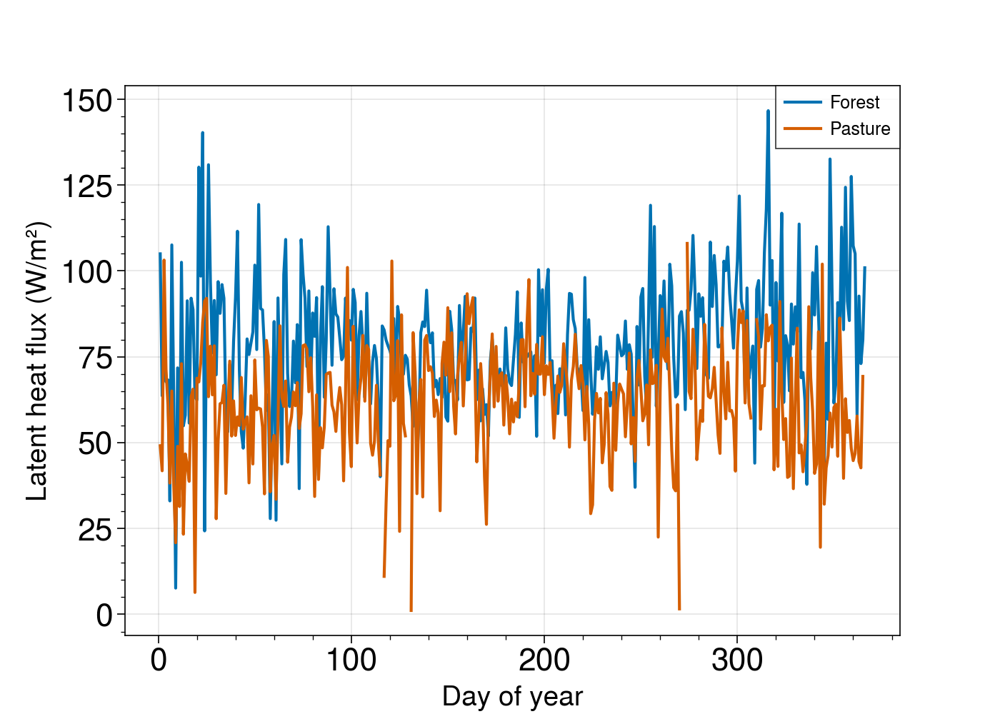

In [494]:
jbr_data.groupby(jbr_data.index.dayofyear).mean()['LE'].plot(figsize=(7,5), xlabel='Day of year',
                                                             ylabel='Latent heat flux (W/m²)', label='Forest')

fns_data.groupby(fns_data.index.dayofyear).mean()['LE'].plot(figsize=(7,5), xlabel='Day of year',
                                                             ylabel='Latent heat flux (W/m²)', label='Pasture')

plt.legend()

In [ ]:
fns_data_month = fns_data.groupby([fns_data.index.month, fns_data.index.hour]).mean()
jbr_data_month = jbr_data.groupby([jbr_data.index.month, jbr_data.index.hour]).mean()